<a href="https://colab.research.google.com/github/Vibs00/Case-Studies---Analytics/blob/main/Business_Case_Vibha_GMC_Descriptive_Statistics_%26_Probability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Business Case: A gym equipment manufactoring company (Vibha-GMC) - Descriptive Statistics & Probability</h1>
<p>
  Vibha-GMC is a leading brand in the field of fitness equipment. Vibha-GMC 
  provides a product range including machines such as treadmills, exercise 
  bikes, gym equipment, and fitness accessories to cater to the needs of all 
  categories of people.

  We'll analyse the given data to generate data driven insights for Vibha-GMC.The 
  company collected the data on individuals who purchased a treadmill from the 
  Vibha-GMC stores during the prior three months. The dataset has the following 
  features:
  <table>
    <tr>
      <td>Product Purchased</td>
      <td>KP281, KP481, or KP781</td>
    </tr>
    <tr>
      <td>Age</td>
      <td>In years</td>
    </tr>
    <tr>
      <td>Gender</td>
      <td>Male/Female</td>
    <tr>
      <td>Education</td>
      <td>In years</td>
    </tr>
    <tr>
      <td>MaritalStatus</td>
      <td>Single or partnered</td>
    </tr>
    <tr>
      <td>Usage</td>
      <td>	The average number of times the customer plans to use the treadmill 
      each week.</td>
    </tr>
    <tr>
      <td>Income</td>
      <td>Annual income (in $)</td>
    </tr>
    <tr>
      <td>Fitness</td>
      <td>	Self-rated fitness on a 1-to-5 scale, where 1 is the poor shape and 
      5 is the excellent shape.</td>
    </tr>
    <tr>
      <td>Miles</td>
      <td>The average number of miles the customer expects to walk/run each 
      week.</td>
    </tr>
</table></br>

<u>Product Portfolio</u>:
<ul>
  <li>The KP281 is an entry-level treadmill that sells for &#36;1,500.</li>
  <li>The KP481 is for mid-level runners that sell for &#36;1,750.</li>
  <li>The KP781 treadmill is having advanced features that sell for &#36;2,500.
  </li>
</ul>

**Table of content: -**
<ol>
  <li>Importing Data and Analysing Basic Metrics</li>
  <li>Non-Graphical Data Analysis and some Outlier Detection</li>
  <li>Missing Value Detection</li>
  <li>Outlier Detection & Skewness</li>
  <li>Binning Numerical Data</li>
  <li>Graphical Analysis</li>
  <li>Conclusion</li>
</ol>


</p>

# 1. Importing Data and Analysing Basic Metrics

In [ ]:
# Downloading Netflix.csv into netflix.csv
filename = pd.read_csv(".\vibha_gmc_treadmill.csv")
filename

--2023-03-10 08:30:10--  https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/001/125/original/aerofit_treadmill.csv?1639992749
Resolving d2beiqkhq929f0.cloudfront.net (d2beiqkhq929f0.cloudfront.net)... 13.249.139.116, 13.249.139.66, 13.249.139.133, ...
Connecting to d2beiqkhq929f0.cloudfront.net (d2beiqkhq929f0.cloudfront.net)|13.249.139.116|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7279 (7.1K) [text/plain]
Saving to: ‘aerofit_treadmill.csv’

aerofit_treadmill.c 100%[===================>]   7.11K  --.-KB/s    in 0s      

2023-03-10 08:30:10 (52.1 MB/s) - ‘aerofit_treadmill.csv’ saved [7279/7279]



In [ ]:
# Importing python libraries to help with our data analysis
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns

from collections import Counter
import math

In [ ]:
# Reading the content of "vibha_gmc_treadmill.csv" file and viewing the first 5 rows
original = pd.read_csv("vibha_gmc_treadmill.csv")
original.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles
0,KP281,18,Male,14,Single,3,4,29562,112
1,KP281,19,Male,15,Single,2,3,31836,75
2,KP281,19,Female,14,Partnered,4,3,30699,66
3,KP281,19,Male,12,Single,3,3,32973,85
4,KP281,20,Male,13,Partnered,4,2,35247,47


In [ ]:
# Checking the total number of rows in our original dataset,
# checking total number of columns in our original dataset,
# checking number of non-null values per column, and
# checking datatype of values in each column 
original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Product        180 non-null    object
 1   Age            180 non-null    int64 
 2   Gender         180 non-null    object
 3   Education      180 non-null    int64 
 4   MaritalStatus  180 non-null    object
 5   Usage          180 non-null    int64 
 6   Fitness        180 non-null    int64 
 7   Income         180 non-null    int64 
 8   Miles          180 non-null    int64 
dtypes: int64(6), object(3)
memory usage: 12.8+ KB


<p>
  <u><em>Technical Analysis 1.1</u>: -</em> From the output of block [7] and block [10] 
  we see that -
  <ul>
    <li>Total records in our dataset = 180</li>
    <li>There are 9 features in total and none of them contains null values.
    </li>
    <li>The 9 features are - Product, Age, Gender, Education, MaritalStatus, 
    Usage, Fitness, Income, Miles.
    <li>Data Type for "Product", "Gender", "MaritalStatus" is "object" and 
    "Age", "Education", "Usage", "Fitness", "Income", and "Miles" are is 
    "Integer" type.
    </li>
  </ul> 
</p>

# 2. Non-Graphical Analysis and some Outlier Detection

In [ ]:
# Getting statistical insights from our data
original.describe()

,Age,Education,Usage,Fitness,Income,Miles
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,28.788889,15.572222,3.455556,3.311111,53719.577778,103.194444
std,6.943498,1.617055,1.084797,0.958869,16506.684226,51.863605
min,18.000000,12.000000,2.000000,1.000000,29562.000000,21.000000
25%,24.000000,14.000000,3.000000,3.000000,44058.750000,66.000000
50%,26.000000,16.000000,3.000000,3.000000,50596.500000,94.000000
75%,33.000000,16.000000,4.000000,4.000000,58668.000000,114.750000
max,50.000000,21.000000,7.000000,5.000000,104581.000000,360.000000


In [ ]:
# Calculating and storing statistical values
# for numerical features in our original dataset

original_stats = original.describe()
original_stats.loc['iqr'] = (original_stats.loc['75%', :] - original_stats.loc['25%', :])
for_upper_whisker = (original_stats.loc['75%', :] + original_stats.loc['iqr', :]*1.5)
for col in for_upper_whisker.index:
  original_stats.loc['upper_whisker', col] = original.loc[original[col] <= for_upper_whisker[col], col].max()

for_lower_whisker = (original_stats.loc['25%', :] - original_stats.loc['iqr', :]*1.5)

for col in for_lower_whisker.index:
  original_stats.loc['lower_whisker', col] = original.loc[original[col] >= for_lower_whisker[col], col].min()

original_stats.loc['mean', :] = original_stats.loc['mean', :].round(2)

original_stats

,Age,Education,Usage,Fitness,Income,Miles
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,28.790000,15.570000,3.460000,3.310000,53719.580000,103.190000
std,6.943498,1.617055,1.084797,0.958869,16506.684226,51.863605
min,18.000000,12.000000,2.000000,1.000000,29562.000000,21.000000
25%,24.000000,14.000000,3.000000,3.000000,44058.750000,66.000000
50%,26.000000,16.000000,3.000000,3.000000,50596.500000,94.000000
75%,33.000000,16.000000,4.000000,4.000000,58668.000000,114.750000
max,50.000000,21.000000,7.000000,5.000000,104581.000000,360.000000
iqr,9.000000,2.000000,1.000000,1.000000,14609.250000,48.750000
upper_whisker,46.000000,18.000000,5.000000,5.000000,77191.000000,180.000000


<p>
  <u><em>General Analysis 1.1</u>: -</em> From the output of block [5]. We see that -
  <ul>
    <li>"Age" → 
      <ul>
        <li>There are 180 record available.</li>
        <li>The mean age = 28.79
        <li>The median age = 26.00</li>
        <li>From mean and median age we can see that <b>Mean Age > Median Age
        </b>. As mean is more affected because of outliers, than median. This 
        means that we can <b>expect outliers for higher ages</b>.</li>
        <li>Also, since <b>Mean Age > Median Age</b>, we can 
        <b>expect right skewed distribution</b> of Ages.</li>
        <li>The minimum age = 18.00</li>
        <li>The maximum age = 50.00</li>
        <li>25% of the entries have Age <= 24 years</li>
        <li>50% of the entries have Age (median) <= 26 years</li>
        <li>75% of the entries have Age <= 33 years</li>
        <li>The middle half of our data lies between 33 years and 24 years. That
         means the <b>Interquartile Range (IQR) = (33-24) = 9 years</b>. Which 
        can also be called the middle spread of our data.</li>
        <li>If we plot a box plot for this feature, the 
        <b>Lower Whisker = The smallest value that is no smaller than ( 25th percentile - (1.5 * IQR)) = The smallest value that is no smaller than (24.0 - 13.5 ) = The smallest value that is no smaller than ( 10.5 ) = 18
        </b>years.</li>
        <li>From the Lower Whisker value and Minimum Age in our data we can see 
        that there is no outlier in lower half of our data.</li>
        <li>The <b>Upper Whisker = The largest value that is no greater than ( 75th percentile + (1.5 * IQR) ) = The largest value that is no greater than ( 33 + 13.5 ) = 
        The largest value that is no greater than ( 46.5 ) = 46</b> years.</li>
        <li>From the Upper Whisker value and Maximum Age in our data we can see 
        that all ages > 46 years will be outliers in our data. Since our 
        maximum age = 50, we know atleast 50 years will be an outlier.</li>
        <b><u><li>This inturn means our dataset contains more data for younger people.</li></u></b>
        <li>The standard daviation for Age = 6.94 years, which is moderate compared to the ages, this also explains the moderate Interquartile Range.</li>
      </ul>
    </li>
    <li>"Education" → 
      <ul>
        <li>There are 180 record available.</li>
        <li>The mean education = 15.57
        <li>The median education = 16.00</li>
        <li>From mean and median educations we can see that <b>Mean Education < Median Education
        </b>. As mean is more affected because of outliers, than median. This 
        means that we can <b>expect outliers for lower values.</b>.</li>
        <li>Also, since <b>Mean Education < Median Education</b>, we can 
        <b>expect left skewed distribution</b> of Education.</li>
        <li>The minimum education = 12.00</li>
        <li>The maximum education = 21.00</li>
        <li>25% of the entries have education <= 14 years</li>
        <li>50% of the entries have education (median) <= 16 
        years</li>
        <li>75% of the entries have education <= 16 years</li>
        <li>Since <b>Median (50%) = Upper Quartile (75%) = 16 years</b>, this means that 50% of education values < 16 years AND 75% of education values is also < 16 years. This means <b> the education data between median and upper quartile contains only one value = 16</b> years.</li>
        <li>The middle half of our data lies between 16 years and 14 years. That
         means the <b>Interquartile Range (IQR) = (16-14) = 2 years</b>. Which 
        can also be called the middle spread of our data.</li>
        <li>If we plot a box plot for this feature, the 
        <b>Lower Whisker = The smallest value that is no smaller than ( 25th percentile - (1.5 * IQR) ) = The smallest value that is no smaller than ( 14.0 - 3 ) = The smallest value that is no smaller than ( 11.0 ) = 12
        </b>years.</li>
        <li>From the Lower Whisker value and Minimum Education in our data we can see 
        that there is no outlier in lower half of our data.</li>
        <li>The <b>Upper Whisker = The largest value that is no greater than ( 75th percentile + (1.5 * IQR) ) = The largest value that is no greater than ( 16.0 + 3 ) = The largest value that is no greater than ( 19.0 ) = 18</b> years.</li>
        <li>From the Upper Whisker value and Maximum Education in our data we can see 
        that all education values > 18 years will be outliers in our data. Since our 
        maximum education = 21, we know atleast 21 years will be an outlier.</li>
        <li>Plus our above assumption of finding outliers in lower half of the data is overruled. But, since Mean Education years is < median education years AND there are no outliers in lower range of data, but there are outliers in higher range. We can infer that the outliers in the higher ranges will have lower frequency than smaller values.</li>
        <b><u><li>This inturn means in our dataset there are more number of people with less education.</li></u></b>
        <li>The standard daviation for Education = 1.62 years, which is low as compared to the education values, this also explains the low Interquartile Range.</li>
      </ul>
    <li>"Usage" → 
      <ul>
        <li>There are 180 record available.</li>
        <li>The mean usage = 3.46
        <li>The median usage = 3.00</li>
        <li>From mean and median usage we can see that <b>Mean Usage > Median Usage
        </b>. As mean is more affected because of outliers, than median. This 
        means that we can <b>expect outliers for higher usages</b>.</li>
        <li>Also, since <b>Mean Usage > Median Usage</b>, we can 
        <b>expect right skewed distribution</b> of Usages.</li>
        <li>This skewness will not be very significant as mean usage and median usage don't differ by a great amount.</li>
        <li>The minimum usage = 2.00</li>
        <li>The maximum age = 7.00</li>
        <li>25% of the entries have Usage <= 3 days/week</li>
        <li>50% of the entries have Usage (median) <= 3 days/week</li>
        <li>75% of the entries have Usage <= 4 days/week</li>
        <li>The middle half of our data lies between 4 days/week and 3 days/week. That
         means the <b>Interquartile Range (IQR) = (4-3) = 1 days/week</b>. Which 
        can also be called the middle spread of our data.</li>
        <li>Since <b>Median (50%) = Lower Quartile (25%) = 3 days/week</b>, this means that 50% of usage values < 3 days/week AND 25% of usage values is also < 3 days/week. This means <b> the usage data between lowe quartile and median contains only one value = 3</b> days/week.</li>
        <li>If we plot a box plot for this feature, the 
        <b>Lower Whisker = The smallest value that is no smaller than ( 25th percentile - (1.5 * IQR) ) = The smallest value that is no smaller than ( 3.0 - 1.5 ) = The smallest value that is no smaller than ( 1.5 ) = 1
        </b>days/week.</li>
        <li>From the Lower Whisker value and Minimum Usage in our data we can see 
        that there is no outlier in lower half of our data.</li>
        <li>The <b>Upper Whisker = The largest value that is no greater than ( 75th percentile + (1.5 * IQR) ) = The largest value that is no greater than ( 4.0 + 1.5 ) = The largest value that is no greater than ( 5.5 ) = 5</b> days/week.</li>
        <li>From the Upper Whisker value and Maximum Usage in our data we can see 
        that all usages > 5 days/week will be outliers in our data. Since our 
        maximum usage = 7, we know atleast 7 days/week will be an outlier.</li>
        <b><u><li>This inturn means in our dataset there are more people who'll use the trademill less.</li></u></b>
      <li>The standard daviation for Usage = 1.08 days/week, which is low compared to the usages, this also explains the low Interquartile Range.</li>
    </li>
    </ul>
    <li>"Fitness" → 
      <ul>
        <li>There are 180 record available.</li>
        <li>The mean fitness = 3.31
        <li>The median fitness = 3.00</li>
        <li>From mean and median fitness we can see that <b>Mean Fitness > Median Fitness
        </b>. As mean is more affected because of outliers, than median. This 
        means that we can <b>expect outliers for higher fitness values</b>.</li>
        <li>Also, since <b>Mean Fitness > Median Fitness</b>, we can 
        <b>expect right skewed distribution</b> of Ages.</li>
        <li>The minimum fitness = 1.00</li>
        <li>The maximum fitness = 5.00</li>
        <li>25% of the entries have Fitness <= 3</li>
        <li>50% of the entries have Fitness (median) <= 3</li>
        <li>75% of the entries have Fitness <= 4</li>
        <li>The middle half of our data lies between 4 and 3. That
         means the <b>Interquartile Range (IQR) = (4-3) = 1</b>. Which 
        can also be called the middle spread of our data.</li>
        <li>If we plot a box plot for this feature, the 
        <b>Lower Whisker = The smallest value that is no smaller than ( 25th percentile - (1.5 * IQR) ) = The smallest value that is no smaller than ( 3.0 - 1.5 ) = he smallest value that is no smaller than ( 1.5 ) = 1
        </b>.</li>
        <li>From the Lower Whisker value and Minimum Fitness in our data we can see 
        that there will be outliers in lower half of our data, wherever Fitness values < 1.</li>
        <li>The <b>Upper Whisker = The largest value that is no greater than ( 75th percentile + (1.5 * IQR) ) = The largest value that is no greater than ( 4 + 1.5 ) = The largest value that is no greater than ( 5.5 ) = 5</b>.</li>
        <li>From the Upper Whisker value and Maximum Fitness in our data we can see 
        that there will be no outliers in the upper half of out data.</li>
        <li>This overrules our earlier assumption of finding outliers in the higer ranges of Fitness. On the contrary we found outliers in the lower ranges of Fitness. This means that the outliers in the lower ranges are very less in frequency than the higer values. That is why mean got shifted to the higher values, rather than the lower values.
    </li>
    <li>The standard daviation for Fitness = 0.96, which is very low as compared to the fitness values, this also explains the low Interquartile Range.</li>
    </ul>
  </li>
  <li>"Income" → 
    <ul>
      <li>There are 180 record available.</li>
      <li>The mean income = $53,719.58
      <li>The median income = $50,596.50</li>
      <li>From mean and median incomes we can see that <b>Mean Income > Median Income
      </b>. As mean is more affected because of outliers, than median. This 
      means that we can <b>expect outliers for higher incomes</b>.</li>
      <li>Also, since <b>Mean Income > Median Income</b>, we can 
      <b>expect right skewed distribution</b> of Incomes.</li>
      <li>The minimum income = $29,562.00</li>
      <li>The maximum income = $1,04,581.00</li>
      <li>25% of the entries have Income <= $44,058.75</li>
      <li>50% of the entries have Income (median) <= $50,596.50</li>
      <li>75% of the entries have Income <= $58,668.00</li>
      <li>The middle half of our data lies between $58,668.00 and $44,058.75. That
        means the <b>Interquartile Range (IQR) = ($58,668.00 - $44,058.75) = $14,609.25</b>. Which 
      can also be called the middle spread of our data.</li>
      <li>If we plot a box plot for this feature, the 
      <b>Lower Whisker = The smallest value that is no smaller than ( 25th percentile - (1.5 * IQR) ) = The smallest value that is no smaller than ( $44,058.75 - $21,913.87 ) = The smallest value that is no smaller than ( $22,144.875 ) = $29,562
      </b>.</li>
      <li>From the Lower Whisker value and Minimum Income in our data we can see 
      that there is no outlier in lower half of our data.</li>
      <li>The <b>Upper Whisker = The largest value that is no larger than (  75th percentile + (1.5 * IQR) ) = The largest value that is no larger than (  $58,668.00 + $21,913.87 ) = The largest value that is no larger than ( $80,581.87 ) = $77,191
      </b>.</li>
      <li>From the Upper Whisker value and Maximum Income in our data we can see 
      that all incomes > $77,191 will be outliers in our data. Since our 
      maximum income = $1,04,581.00, we know atleast $1,04,581.00 will be an outlier.</li>
      <b><u><li>This inturn means in our dataset there are more number of people with low income.</li></u></b>
      <li>The standard daviation for Income = $16,506.68, which is low as compared to the incomes, this also explains the low Interquartile Range.</li>
      </ul>
    </li>
    <li>"Miles" → 
      <ul>
        <li>There are 180 record available.</li>
        <li>The mean miles = 103.19 miles.</li>
        <li>The median miles = 94.00 miles.</li>
        <li>From mean and median miles we can see that <b>Mean Miles > Median Miles
        </b>. As mean is more affected because of outliers, than median. This 
        means that we can <b>expect outliers for higher miles</b>.</li>
        <li>Also, since <b>Mean Miles > Median Miles</b>, we can 
        <b>expect right skewed distribution</b> of Miles.</li>
        <li>The minimum miles = 21.00 miles</li>
        <li>The maximum miles = 360.00 miles</li>
        <li>25% of the entries have Miles <= 66.00 miles</li>
        <li>50% of the entries have Miles (median) <= 94.00 miles</li>
        <li>75% of the entries have Miles <= 114.75 miles</li>
        <li>The middle half of our data lies between 114.75 miles and 66.00 miles. That
         means the <b>Interquartile Range (IQR) = (114.75-66.00) = 48.75 miles</b>. Which 
        can also be called the middle spread of our data.</li>
        <li>If we plot a box plot for this feature, the 
        <b>Lower Whisker = The smallest value that is no smaller than ( 25th percentile - (1.5 * IQR) ) = The smallest value that is no smaller than ( 66.00 - 73.12 ) = The smallest value that is no smaller than ( -7.12 )
        </b>miles. But since distance can't be negative we'll take <b>Lower Whisker = The smallest value that is no smaller than ( 0 ) = 21 miles</b> instead.</li>
        <li>From the Lower Whisker value and Minimum Miles in our data we can see 
        that there is no outlier in lower half of our data.</li>
        <li>The <b>Upper Whisker = The largest value that is no larger than (  75th percentile + (1.5 * IQR) ) = The largest value that is no larger than (  114.75 + 73.12 ) = The largest value that is no larger than ( 187.87 ) = 180 </b>miles.</li>
        <li>From the Upper Whisker value and Maximum Miles in our data we can see 
        that all distances (Miles) > 180 miles will be outliers in our data. Since our 
        maximum miles = 360.00 miles, we know atleast 360.00 miles will be an outlier.</li>
        <b><u><li>This inturn means in our dataset there are more number of people who run/walk less.</li></u></b>
        <li>The standard daviation for Miles = 51.86 miles, which is very high as compared to the miles waled/run, this also explains the big Interquartile Range.</li>
        </ul>
      </li>
  </ul>
</p>

In [ ]:
# Getting insights from categorical features from our data
original.describe(include='object')

,Product,Gender,MaritalStatus
count,180,180,180
unique,3,2,2
top,KP281,Male,Partnered
freq,80,104,107


<p>
  <u><em>General Analysis 1.2</u>: -</em> From the output of block [6]. We see 
  that -
  <ul>
    <li>Product →
      <ul>
        <li>Total number of records which contain Product are 180.</li>
        <li>There are 3 unique types of Products.</li>
        <li>The most prominent Product is "KP281" which occures 44.44% times out of 180 records.</li>
      </ul>
    </li>
    <li>Gender →
      <ul>
        <li>Total number of records which contain Gender are 180.</li>
        <li>There are 2 unique types of Gender.</li>
        <li>The most prominent Gender is "Male" which occures 57.78% times out of 180 records.</li>
      </ul>
    </li>
    <li>MaritalStatus →
      <ul>
        <li>Total number of records which contain MaritalStatus are 180.</li>
        <li>There are 2 unique types of MaritalStatus.</li>
        <li>The most prominent MaritalStatus is "Partnered" which occures 59.44% times out of 180 records.</li>
        <li>This means that we have more number of married/partnered people 
        than non-partnered people.
      </ul>
    </li>      
  </ul>
</p>

In [ ]:
# Checking unique values for each categorical feature
for category in original.describe(include='object').columns:
  print("Unique values for " + category + " ->")
  print(original[category].value_counts())
  print()

Unique values for Product ->
KP281    80
KP481    60
KP781    40
Name: Product, dtype: int64

Unique values for Gender ->
Male      104
Female     76
Name: Gender, dtype: int64

Unique values for MaritalStatus ->
Partnered    107
Single        73
Name: MaritalStatus, dtype: int64



<p>
  <u><em>General Analysis 1.3</u>: -</em> From the output of block [22]. We see 
  that -
  <ul>
    <li>3 unique Products →
      <ul>
        <li>KP281</li>
        <li>KP481</li>
        <li>KP781</li>
      </ul>
    </li>
    <li>2 unique Genders →
      <ul>
        <li>Male</li>
        <li>Female</li>
      </ul>
    </li>
    <li>2 unique MaritalStatus →
      <ul>
        <li>Partnered</li>
        <li>Single</li>
      </ul>
    </li>      
  </ul>
</p>

# 3. Missing Value Detection

In [ ]:
for column in original.columns:
  print(column + " has " + str(sum(original[column].isnull())) + " Nulls.")

Product has 0 Nulls.
Age has 0 Nulls.
Gender has 0 Nulls.
Education has 0 Nulls.
MaritalStatus has 0 Nulls.
Usage has 0 Nulls.
Fitness has 0 Nulls.
Income has 0 Nulls.
Miles has 0 Nulls.


<p>
  <u><em>General Analysis 3.1</u>: -</em> From the output of block [42]. We see 
  that -
  <ul>
    <li>There is <b>NO</b> column with Blank/Missing values. So filling missing is not required for this analysis.
    </li>    
  </ul>
</p>

# 4. Outlier Detection & Skewness

In [ ]:
original_stats

,Age,Education,Usage,Fitness,Income,Miles
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,28.790000,15.570000,3.460000,3.310000,53719.580000,103.190000
std,6.943498,1.617055,1.084797,0.958869,16506.684226,51.863605
min,18.000000,12.000000,2.000000,1.000000,29562.000000,21.000000
25%,24.000000,14.000000,3.000000,3.000000,44058.750000,66.000000
50%,26.000000,16.000000,3.000000,3.000000,50596.500000,94.000000
75%,33.000000,16.000000,4.000000,4.000000,58668.000000,114.750000
max,50.000000,21.000000,7.000000,5.000000,104581.000000,360.000000
iqr,9.000000,2.000000,1.000000,1.000000,14609.250000,48.750000
upper_whisker,46.000000,18.000000,5.000000,5.000000,77191.000000,180.000000


<p>
  <u><em>Quick Note</u>: -</em> From our preliminary analysis in Section 1 we concluded that there can be outliers in the numerical columns. That is, there can be outliers in "Age", "Education", "Usage", "Fitness", "Income", and "Miles". Lets look into these further...
</p>

In [ ]:
# Set plot style for all plots
sns.set_style('darkgrid')

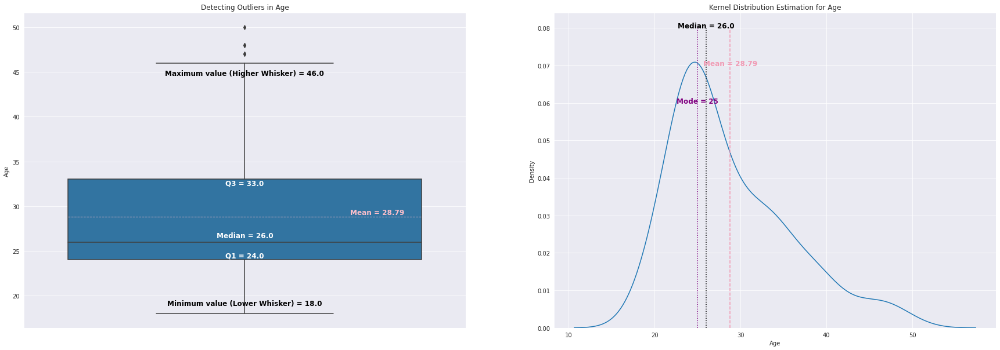

In [ ]:
# Visualising "Age" feature
fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax = sns.boxplot(data = original, y='Age',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Detecting Outliers in Age")

plt.subplot(1, 2, 2)
ax_ = sns.kdeplot(data = original, x='Age')
plt.title("Kernel Distribution Estimation for Age")

mode_age = original['Age'].mode().values

xtick = ax.get_xticks()
ax.text(xtick,original_stats.loc['50%', 'Age']*1.02,"Median = " + str(original_stats.loc['50%', 'Age']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['25%', 'Age']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Age']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['75%', 'Age']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Age']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['upper_whisker', 'Age']*0.97,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Age']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick,original_stats.loc['lower_whisker', 'Age']*1.05,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Age']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick+.3,original_stats.loc['mean', 'Age']*1.01,"Mean = " + str(original_stats.loc['mean', 'Age']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')

xtick_ = ax.get_xticks()[0]
yticks_ = ax_.get_yticks()
ax_.vlines(xtick_+original_stats.loc['mean', 'Age'], ymin=0, ymax=yticks_[-1],
           color='#f199b3', linestyle='--')
ax_.text(xtick_+original_stats.loc['mean', 'Age'], yticks_[-2],"Mean = " + str(original_stats.loc['mean', 'Age']), 
        horizontalalignment='center',size='large',color='#f199b3',weight='semibold')
ax_.vlines(xtick_+original_stats.loc['50%', 'Age'], ymin=0, ymax=yticks_[-1],
           color='black', linestyle=':')
ax_.text(xtick_+original_stats.loc['50%', 'Age'],yticks_[-1],"Median = " + str(original_stats.loc['50%', 'Age']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax_.vlines(xtick_+mode_age, ymin=0, ymax=yticks_[-1],
           color='purple', linestyle=':')
ax_.text(xtick_+mode_age,yticks_[-3],"Mode = " + str(mode_age[0]), 
        horizontalalignment='center',size='large',color='purple',weight='semibold')


plt.show()

<p>
  <u><em>Quick Note</u>: -</em> From the above plot we can see that there are outliers for the higher limits of Age. Lets check the outliers -
</p>

In [ ]:
# Outliers for Age

print("Total number of outliers above Higher Whisker = " + str(len(original[original['Age'] > original_stats.loc['upper_whisker', 'Age']])))
print(original[original['Age'] > original_stats.loc['upper_whisker', 'Age']])

print()

print("Total number of outliers below Lower Whisker = " + str(len(original[original['Age'] < original_stats.loc['lower_whisker', 'Age']])))
print(original[original['Age'] < original_stats.loc['lower_whisker', 'Age']])

Total number of outliers above Higher Whisker = 5
    Product  Age  Gender  Education MaritalStatus  Usage  Fitness  Income  \
78    KP281   47    Male         16     Partnered      4        3   56850   
79    KP281   50  Female         16     Partnered      3        3   64809   
139   KP481   48    Male         16     Partnered      2        3   57987   
178   KP781   47    Male         18     Partnered      4        5  104581   
179   KP781   48    Male         18     Partnered      4        5   95508   

     Miles  
78      94  
79      66  
139     64  
178    120  
179    180  

Total number of outliers below Lower Whisker = 0
Empty DataFrame
Columns: [Product, Age, Gender, Education, MaritalStatus, Usage, Fitness, Income, Miles]
Index: []


<p>
  <u><em>General Analysis 4.1</u>: -</em> From output of blocks [84], and [85]. We can see that -
  <ul>
    <li>There are 5 outliers for higher values of Age in our dataset.</li>
    <li>There are 0 outliers for lower values for Age in our dataset.</li>
    <li>The KDE plot is a <b>Unimodal curve</b>. This means that Age values have only one mode.</li>
  </ul>
</p>

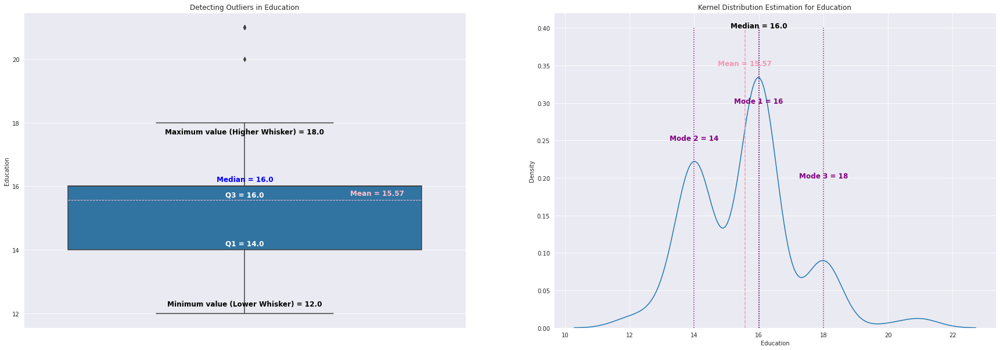

In [ ]:
# Visualising "Education" feature
fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax = sns.boxplot(data = original, y='Education',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Detecting Outliers in Education")

plt.subplot(1, 2, 2)
ax_ = sns.kdeplot(data = original, x='Education')
plt.title("Kernel Distribution Estimation for Education")

modes = Counter(original['Education']).most_common(3)

xtick = ax.get_xticks()
ax.text(xtick,original_stats.loc['50%', 'Education']*1.01,"Median = " + str(original_stats.loc['50%', 'Education']), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax.text(xtick,original_stats.loc['25%', 'Education']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Education']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['75%', 'Education']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Education']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['upper_whisker', 'Education']*0.98,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Education']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick,original_stats.loc['lower_whisker', 'Education']*1.02,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Education']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick+.3,original_stats.loc['mean', 'Education']*1.01,"Mean = " + str(original_stats.loc['mean', 'Education']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')

xtick_ = ax.get_xticks()[0]
yticks_ = ax_.get_yticks()
ax_.vlines(xtick_+original_stats.loc['mean', 'Education'], ymin=0, ymax=yticks_[-1],
           color='#f199b3', linestyle='--')
ax_.text(xtick_+original_stats.loc['mean', 'Education'], yticks_[-2],"Mean = " + str(original_stats.loc['mean', 'Education']), 
        horizontalalignment='center',size='large',color='#f199b3',weight='semibold')
ax_.vlines(xtick_+original_stats.loc['50%', 'Education'], ymin=0, ymax=yticks_[-1],
           color='black', linestyle=':')
ax_.text(xtick_+original_stats.loc['50%', 'Education'],yticks_[-1],"Median = " + str(original_stats.loc['50%', 'Education']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
for i, mode in enumerate(modes):
  ax_.vlines(xtick_+mode[0], ymin=0, ymax=yticks_[-1],
            color='purple', linestyle=':')
  ax_.text(xtick_+mode[0],yticks_[-3]-(i*0.05),"Mode " + str(i+1) + " = " + str(mode[0]), 
        horizontalalignment='center',size='large',color='purple',weight='semibold')

plt.show()

<p>
  <u><em>Quick Note</u>: -</em> From the above plot we can see that there are outliers for the higher limits of Education. Lets check the outliers -
</p>

In [ ]:
# Outliers for Education

print("Total number of outliers above Higher Whisker = " + str(len(original[original['Education'] > original_stats.loc['upper_whisker', 'Education']])))
print(original[original['Education'] > original_stats.loc['upper_whisker', 'Education']])

print()

print("Total number of outliers below Lower Whisker = " + str(len(original[original['Education'] < original_stats.loc['lower_whisker', 'Education']])))
print(original[original['Education'] < original_stats.loc['lower_whisker', 'Education']])

Total number of outliers above Higher Whisker = 4
    Product  Age  Gender  Education MaritalStatus  Usage  Fitness  Income  \
156   KP781   25    Male         20     Partnered      4        5   74701   
157   KP781   26  Female         21        Single      4        3   69721   
161   KP781   27    Male         21     Partnered      4        4   90886   
175   KP781   40    Male         21        Single      6        5   83416   

     Miles  
156    170  
157    100  
161    100  
175    200  

Total number of outliers below Lower Whisker = 0
Empty DataFrame
Columns: [Product, Age, Gender, Education, MaritalStatus, Usage, Fitness, Income, Miles]
Index: []


<p>
  <u><em>General Analysis 4.2</u>: -</em> From output of blocks [90], and [91]. We can see that -
  <ul>
    <li>There are 4 outliers for higher values of Education in our dataset.</li>
    <li>There are 0 outliers for lower values for Education in our dataset.</li>
    <li>The KDE plot is a <b>Unimodal curve</b>. This means that Education values have only one mode. The second highest and 3rd highest modes are also provided, where we see 2 more peaks.</li>
  </ul>
</p>

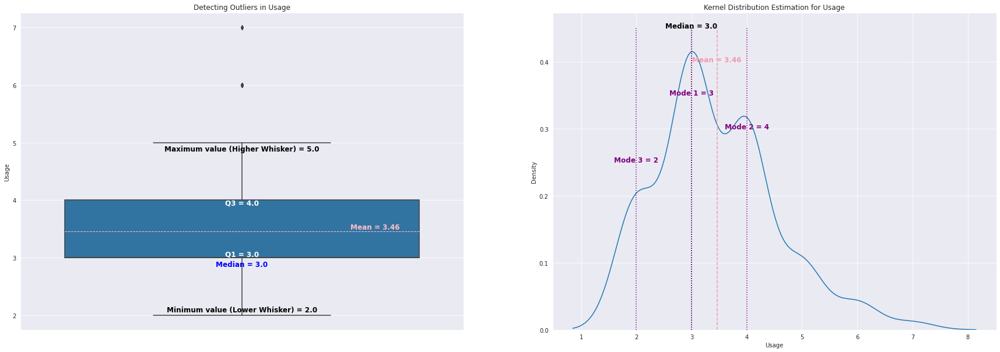

In [ ]:
# Visualising "Usage" feature
fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax = sns.boxplot(data = original, y='Usage',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Detecting Outliers in Usage")

plt.subplot(1, 2, 2)
ax_ = sns.kdeplot(data = original, x='Usage')
plt.title("Kernel Distribution Estimation for Usage")

modes = Counter(original['Usage']).most_common(3)

xtick = ax.get_xticks()
ax.text(xtick,original_stats.loc['50%', 'Usage']*0.95,"Median = " + str(original_stats.loc['50%', 'Usage']), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax.text(xtick,original_stats.loc['25%', 'Usage']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Usage']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['75%', 'Usage']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Usage']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['upper_whisker', 'Usage']*0.97,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Usage']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick,original_stats.loc['lower_whisker', 'Usage']*1.03,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Usage']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick+.3,original_stats.loc['mean', 'Usage']*1.01,"Mean = " + str(original_stats.loc['mean', 'Usage']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')

xtick_ = ax.get_xticks()[0]
yticks_ = ax_.get_yticks()
ax_.vlines(xtick_+original_stats.loc['mean', 'Usage'], ymin=0, ymax=yticks_[-1],
           color='#f199b3', linestyle='--')
ax_.text(xtick_+original_stats.loc['mean', 'Usage'], yticks_[-2],"Mean = " + str(original_stats.loc['mean', 'Usage']), 
        horizontalalignment='center',size='large',color='#f199b3',weight='semibold')
ax_.vlines(xtick_+original_stats.loc['50%', 'Usage'], ymin=0, ymax=yticks_[-1],
           color='black', linestyle=':')
ax_.text(xtick_+original_stats.loc['50%', 'Usage'],yticks_[-1],"Median = " + str(original_stats.loc['50%', 'Usage']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
for i, mode in enumerate(modes):
  ax_.vlines(xtick_+mode[0], ymin=0, ymax=yticks_[-1],
            color='purple', linestyle=':')
  ax_.text(xtick_+mode[0],yticks_[-3]-(i*0.05),"Mode " + str(i+1) + " = " + str(mode[0]), 
        horizontalalignment='center',size='large',color='purple',weight='semibold')

plt.show()


<p>
  <u><em>Quick Note</u>: -</em> From the above plot we can see that there are outliers for the higher limits of Usage. Lets check the outliers -
</p>

In [ ]:
# Outliers for Usage

print("Total number of outliers above Higher Whisker = " + str(len(original[original['Usage'] > original_stats.loc['upper_whisker', 'Usage']])))
print(original[original['Usage'] > original_stats.loc['upper_whisker', 'Usage']])

print()

print("Total number of outliers below Lower Whisker = " + str(len(original[original['Usage'] < original_stats.loc['lower_whisker', 'Usage']])))
print(original[original['Usage'] < original_stats.loc['lower_whisker', 'Usage']])

Total number of outliers above Higher Whisker = 9
    Product  Age  Gender  Education MaritalStatus  Usage  Fitness  Income  \
154   KP781   25    Male         18     Partnered      6        4   70966   
155   KP781   25    Male         18     Partnered      6        5   75946   
162   KP781   28  Female         18     Partnered      6        5   92131   
163   KP781   28    Male         18     Partnered      7        5   77191   
164   KP781   28    Male         18        Single      6        5   88396   
166   KP781   29    Male         14     Partnered      7        5   85906   
167   KP781   30  Female         16     Partnered      6        5   90886   
170   KP781   31    Male         16     Partnered      6        5   89641   
175   KP781   40    Male         21        Single      6        5   83416   

     Miles  
154    180  
155    240  
162    180  
163    180  
164    150  
166    300  
167    280  
170    260  
175    200  

Total number of outliers below Lower Whisker = 0

<p>
  <u><em>General Analysis 4.3</u>: -</em> From output of blocks [104], and [105]. We can see that -
  <ul>
    <li>There are 9 outliers for higher values of Usage in our dataset.</li>
    <li>There are 0 outliers for lower values for Usage in our dataset.</li>
    <li>All these outliers have Product as "KP781"</li>
    <li>Also 8 out of 9 outliers are young based on Age.</li>
    <li>All of them reported high Fitness.</li>
    <li>6 out of 9 are also outliers for Miles column. This means they run/walk more.</li>
    <li>6 out of 9 are also outliers for Income column. This means they have high income than rest of the people in our dataset.</li>
    <li>The KDE plot is a <b>Unimodal curve</b>. This means that Usage values have only one mode. The 2nd and 3rd frequently occuring values are also shown as modes.</li>
  </ul>
</p>

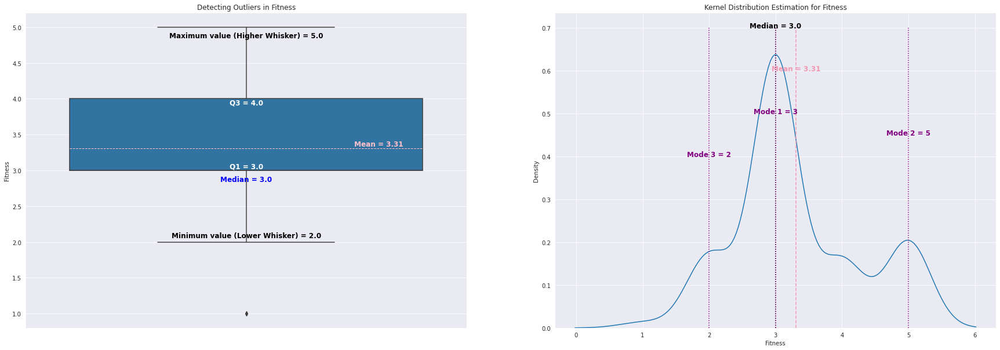

In [ ]:
# Visualising "Fitness" feature
fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax = sns.boxplot(data = original, y='Fitness',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Detecting Outliers in Fitness")

plt.subplot(1, 2, 2)
ax_ = sns.kdeplot(data = original, x='Fitness')
plt.title("Kernel Distribution Estimation for Fitness")

modes = Counter(original['Fitness']).most_common(3)

xtick = ax.get_xticks()
ax.text(xtick,original_stats.loc['50%', 'Fitness']*0.95,"Median = " + str(original_stats.loc['50%', 'Fitness']), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax.text(xtick,original_stats.loc['25%', 'Fitness']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Fitness']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['75%', 'Fitness']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Fitness']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['upper_whisker', 'Fitness']*0.97,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Fitness']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick,original_stats.loc['lower_whisker', 'Fitness']*1.03,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Fitness']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick+.3,original_stats.loc['mean', 'Fitness']*1.01,"Mean = " + str(original_stats.loc['mean', 'Fitness']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')

xtick_ = ax.get_xticks()[0]
yticks_ = ax_.get_yticks()
ax_.vlines(xtick_+original_stats.loc['mean', 'Fitness'], ymin=0, ymax=yticks_[-1],
           color='#f199b3', linestyle='--')
ax_.text(xtick_+original_stats.loc['mean', 'Fitness'], yticks_[-2],"Mean = " + str(original_stats.loc['mean', 'Fitness']), 
        horizontalalignment='center',size='large',color='#f199b3',weight='semibold')
ax_.vlines(xtick_+original_stats.loc['50%', 'Fitness'], ymin=0, ymax=yticks_[-1],
           color='black', linestyle=':')
ax_.text(xtick_+original_stats.loc['50%', 'Fitness'],yticks_[-1],"Median = " + str(original_stats.loc['50%', 'Fitness']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
for i, mode in enumerate(modes):
  ax_.vlines(xtick_+mode[0], ymin=0, ymax=yticks_[-1],
            color='purple', linestyle=':')
  ax_.text(xtick_+mode[0],yticks_[-3]-(i*0.05),"Mode " + str(i+1) + " = " + str(mode[0]), 
        horizontalalignment='center',size='large',color='purple',weight='semibold')


plt.show()

<p>
  <u><em>Quick Note</u>: -</em> From the above plot we can see that there are outliers for the lower limits of Usage. Lets check the outliers -
</p>

In [ ]:
# Outliers for Fitness

print("Total number of outliers above Higher Whisker = " + str(len(original[original['Fitness'] > original_stats.loc['upper_whisker', 'Fitness']])))
print(original[original['Fitness'] > original_stats.loc['upper_whisker', 'Fitness']])

print()

print("Total number of outliers below Lower Whisker = " + str(len(original[original['Fitness'] < original_stats.loc['lower_whisker', 'Fitness']])))
print(original[original['Fitness'] < original_stats.loc['lower_whisker', 'Fitness']])

Total number of outliers above Higher Whisker = 0
Empty DataFrame
Columns: [Product, Age, Gender, Education, MaritalStatus, Usage, Fitness, Income, Miles]
Index: []

Total number of outliers below Lower Whisker = 2
    Product  Age  Gender  Education MaritalStatus  Usage  Fitness  Income  \
14    KP281   23    Male         16     Partnered      3        1   38658   
117   KP481   31  Female         18        Single      2        1   65220   

     Miles  
14      47  
117     21  


<p>
  <u><em>General Analysis 4.4</u>: -</em> From output of blocks [108], and [109]. We can see that -
  <ul>
    <li>There are 0 outliers for higher values of Fitness in our dataset.</li>
    <li>There are 2 outliers for lower values for Fitness in our dataset.</li>
    <li>The KDE plot is a <b>Unimodal curve</b>. This means that Fitness values have only one mode. The 2nd and 3rd frequently occuring values are also shown as modes.</li>
  </ul>
</p>

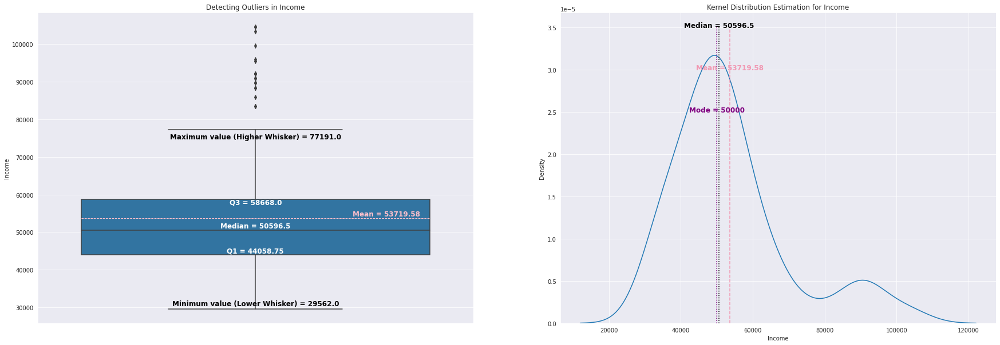

In [ ]:
# Visualising "Income" feature
fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax = sns.boxplot(data = original, y='Income',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Detecting Outliers in Income")

plt.subplot(1, 2, 2)
ax_ = sns.kdeplot(data = original, x='Income')
plt.title("Kernel Distribution Estimation for Income")

modes = Counter(original['Income'].round(-4)).most_common(1)

xtick = ax.get_xticks()
ax.text(xtick,original_stats.loc['50%', 'Income']*1.01,"Median = " + str(original_stats.loc['50%', 'Income']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['25%', 'Income']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Income']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['75%', 'Income']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Income']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['upper_whisker', 'Income']*0.97,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Income']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick,original_stats.loc['lower_whisker', 'Income']*1.03,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Income']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick+.3,original_stats.loc['mean', 'Income']*1.01,"Mean = " + str(original_stats.loc['mean', 'Income']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')

xtick_ = ax_.get_xticks()[0]
yticks_ = ax_.get_yticks()
ax_.vlines(xtick_+original_stats.loc['mean', 'Income'], ymin=0, ymax=yticks_[-1],
           color='#f199b3', linestyle='--')
ax_.text(xtick_+original_stats.loc['mean', 'Income'], yticks_[-2],"Mean = " + str(original_stats.loc['mean', 'Income']), 
        horizontalalignment='center',size='large',color='#f199b3',weight='semibold')
ax_.vlines(xtick_+original_stats.loc['50%', 'Income'], ymin=0, ymax=yticks_[-1],
           color='black', linestyle=':')
ax_.text(xtick_+original_stats.loc['50%', 'Income'],yticks_[-1],"Median = " + str(original_stats.loc['50%', 'Income']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
for i, mode in enumerate(modes):
  ax_.vlines(xtick_+mode[0], ymin=0, ymax=yticks_[-1],
            color='purple', linestyle=':')
  ax_.text(xtick_+mode[0],yticks_[-3],"Mode = " + str(mode[0]), 
        horizontalalignment='center',size='large',color='purple',weight='semibold')


plt.show()

<p>
  <u><em>Quick Note</u>: -</em> From the above plot we can see that there are outliers for the higher limits of Income. Lets check the outliers -
</p>

In [ ]:
# Outliers for Income

print("Total number of outliers above Higher Whisker = " + str(len(original[original['Income'] > original_stats.loc['upper_whisker', 'Income']])))
print(original[original['Income'] > original_stats.loc['upper_whisker', 'Income']])

print()

print("Total number of outliers below Lower Whisker = " + str(len(original[original['Income'] < original_stats.loc['lower_whisker', 'Income']])))
print(original[original['Income'] < original_stats.loc['lower_whisker', 'Income']])

Total number of outliers above Higher Whisker = 19
    Product  Age  Gender  Education MaritalStatus  Usage  Fitness  Income  \
159   KP781   27    Male         16     Partnered      4        5   83416   
160   KP781   27    Male         18        Single      4        3   88396   
161   KP781   27    Male         21     Partnered      4        4   90886   
162   KP781   28  Female         18     Partnered      6        5   92131   
164   KP781   28    Male         18        Single      6        5   88396   
166   KP781   29    Male         14     Partnered      7        5   85906   
167   KP781   30  Female         16     Partnered      6        5   90886   
168   KP781   30    Male         18     Partnered      5        4  103336   
169   KP781   30    Male         18     Partnered      5        5   99601   
170   KP781   31    Male         16     Partnered      6        5   89641   
171   KP781   33  Female         18     Partnered      4        5   95866   
172   KP781   34    Male 

<p>
  <u><em>General Analysis 4.5</u>: -</em> From output of blocks [117], and [118]. We can see that -
  <ul>
    <li>There are 19 outliers for higher values of Income in our dataset.</li>
    <li>There are 0 outliers for lower values for Income in our dataset.</li>
    <li>All of these people have higher earnings than rest of the people in our dataset.</li>
    <li>All of these high earning people have baught "KP781" Product category. Which is the costliest.</li>
    <li>Apart from 1, rest of the 18 outliers have reported high fitness level.</li>
    <li>The KDE plot is a <b>Unimodal curve</b>. This means that Income values have only one mode.</li>
  </ul>
</p>

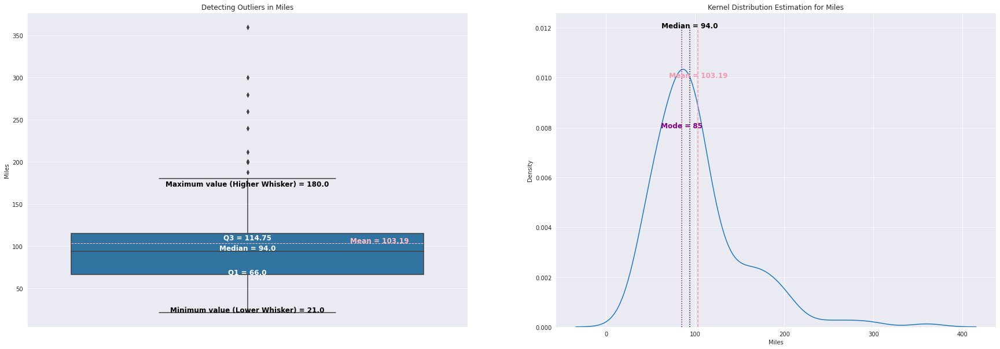

In [ ]:
# Visualising "Miles" feature
fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax = sns.boxplot(data = original, y='Miles',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Detecting Outliers in Miles")

plt.subplot(1, 2, 2)
ax_ = sns.kdeplot(data = original, x='Miles')
plt.title("Kernel Distribution Estimation for Miles")

modes = Counter(original['Miles']).most_common(1)

xtick = ax.get_xticks()
ax.text(xtick,original_stats.loc['50%', 'Miles']*1.01,"Median = " + str(original_stats.loc['50%', 'Miles']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['25%', 'Miles']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Miles']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['75%', 'Miles']*0.94,"Q3 = " + str(original_stats.loc['75%', 'Miles']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax.text(xtick,original_stats.loc['upper_whisker', 'Miles']*0.95,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Miles']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick,original_stats.loc['lower_whisker', 'Miles']*1.05,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Miles']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax.text(xtick+.3,original_stats.loc['mean', 'Miles']*1.01,"Mean = " + str(original_stats.loc['mean', 'Miles']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')

xtick_ = ax.get_xticks()[0]
yticks_ = ax_.get_yticks()
ax_.vlines(xtick_+original_stats.loc['mean', 'Miles'], ymin=0, ymax=yticks_[-1],
           color='#f199b3', linestyle='--')
ax_.text(xtick_+original_stats.loc['mean', 'Miles'], yticks_[-2],"Mean = " + str(original_stats.loc['mean', 'Miles']), 
        horizontalalignment='center',size='large',color='#f199b3',weight='semibold')
ax_.vlines(xtick_+original_stats.loc['50%', 'Miles'], ymin=0, ymax=yticks_[-1],
           color='black', linestyle=':')
ax_.text(xtick_+original_stats.loc['50%', 'Miles'],yticks_[-1],"Median = " + str(original_stats.loc['50%', 'Miles']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
for i, mode in enumerate(modes):
  ax_.vlines(xtick_+mode[0], ymin=0, ymax=yticks_[-1],
            color='purple', linestyle=':')
  ax_.text(xtick_+mode[0],yticks_[-3],"Mode = " + str(mode[0]), 
        horizontalalignment='center',size='large',color='purple',weight='semibold')


plt.show()

In [ ]:
# Outliers for Miles

print("Total number of outliers above Higher Whisker = " + str(len(original[original['Miles'] > original_stats.loc['upper_whisker', 'Miles']])))
print(original[original['Miles'] > original_stats.loc['upper_whisker', 'Miles']])

print()

print("Total number of outliers below Lower Whisker = " + str(len(original[original['Miles'] < original_stats.loc['lower_whisker', 'Miles']])))
print(original[original['Miles'] < original_stats.loc['lower_whisker', 'Miles']])

Total number of outliers above Higher Whisker = 13
    Product  Age  Gender  Education MaritalStatus  Usage  Fitness  Income  \
23    KP281   24  Female         16     Partnered      5        5   44343   
84    KP481   21  Female         14     Partnered      5        4   34110   
142   KP781   22    Male         18        Single      4        5   48556   
148   KP781   24  Female         16        Single      5        5   52291   
152   KP781   25  Female         18     Partnered      5        5   61006   
155   KP781   25    Male         18     Partnered      6        5   75946   
166   KP781   29    Male         14     Partnered      7        5   85906   
167   KP781   30  Female         16     Partnered      6        5   90886   
170   KP781   31    Male         16     Partnered      6        5   89641   
171   KP781   33  Female         18     Partnered      4        5   95866   
173   KP781   35    Male         16     Partnered      4        5   92131   
175   KP781   40    Male 

<p>
  <u><em>General Analysis 4.6</u>: -</em> From output of blocks [191], and [192]. We can see that -
  <ul>
    <li>There are 13 outliers for higher values of Miles in our dataset.</li>
    <li>There are 0 outliers for lower values for Miles in our dataset.</li>
    <li>All of these people have higher Fitness values than rest of the people in our dataset.</li>
    <li>The KDE plot is a <b>Unimodal curve</b>. This means that Miles values have only one mode.</li>
  </ul>
</p>

In [ ]:
# Lets check if these outliers coincide for some records or not

original[((original['Age'] > original_stats.loc['upper_whisker', 'Age']) | (original['Age'] < original_stats.loc['lower_whisker', 'Age']))
        &((original['Education'] > original_stats.loc['upper_whisker', 'Education']) | (original['Education'] < original_stats.loc['lower_whisker', 'Education']))
        &((original['Usage'] > original_stats.loc['upper_whisker', 'Usage']) | (original['Usage'] < original_stats.loc['lower_whisker', 'Usage']))
        &((original['Fitness'] > original_stats.loc['upper_whisker', 'Fitness']) | (original['Fitness'] < original_stats.loc['lower_whisker', 'Fitness']))
        &((original['Income'] > original_stats.loc['upper_whisker', 'Income']) | (original['Income'] < original_stats.loc['lower_whisker', 'Income']))
        &((original['Miles'] > original_stats.loc['upper_whisker', 'Miles']) | (original['Miles'] < original_stats.loc['lower_whisker', 'Miles']))]

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles


In [ ]:
# Lets check if these outliers coincide for 3 features

already_printed = []
for feature1 in (original.describe().columns):
  for feature2 in (original.describe().columns):
    for feature3 in (original.describe().columns):
      twentyfifth_1 = original[feature1].quantile(.25)
      twentyfifth_2 = original[feature2].quantile(.25)
      twentyfifth_3 = original[feature3].quantile(.25)
      seventyfifth_1 = original[feature1].quantile(.75)
      seventyfifth_2 = original[feature2].quantile(.75)
      seventyfifth_3 = original[feature3].quantile(.75)
      iqr_1 = seventyfifth_1 - twentyfifth_1
      iqr_2 = seventyfifth_2 - twentyfifth_2
      iqr_3 = seventyfifth_3 - twentyfifth_3
      higherwhisker_1 = seventyfifth_1 + 1.5*iqr_1
      higherwhisker_2 = seventyfifth_2 + 1.5*iqr_2
      higherwhisker_3 = seventyfifth_3 + 1.5*iqr_3
      lowerwhisker_1 = max(twentyfifth_1 - 1.5*iqr_1, 0)
      lowerwhisker_2 = max(twentyfifth_2 - 1.5*iqr_2, 0)
      lowerwhisker_3 = max(twentyfifth_3 - 1.5*iqr_3, 0)
      if (feature1 != feature2) & (feature2 != feature3) & (feature1 != feature3) & ({feature1, feature2, feature3} not in already_printed):
        temp = original[((original[feature1] > higherwhisker_1) | (original[feature1] < lowerwhisker_1))
                &((original[feature2] > higherwhisker_2) | (original[feature2] < lowerwhisker_2))
                &((original[feature3] > higherwhisker_3) | (original[feature3] < lowerwhisker_3))]
        if len(temp) > 0:
          already_printed.append({feature1, feature2, feature3})
          print(temp[['Product', feature1, feature2, feature3]])
          print()

    Product  Education  Usage  Income
175   KP781         21      6   83416

    Product  Education  Usage  Miles
175   KP781         21      6    200

    Product  Education  Income  Miles
175   KP781         21   83416    200

    Product  Usage  Income  Miles
166   KP781      7   85906    300
167   KP781      6   90886    280
170   KP781      6   89641    260
175   KP781      6   83416    200



In [ ]:
# Lets check if these outliers coincide for 2 features

already_printed = []
for feature1 in (original.describe().columns):
  for feature2 in (original.describe().columns):
      twentyfifth_1 = original[feature1].quantile(.25)
      twentyfifth_2 = original[feature2].quantile(.25)
      seventyfifth_1 = original[feature1].quantile(.75)
      seventyfifth_2 = original[feature2].quantile(.75)
      iqr_1 = seventyfifth_1 - twentyfifth_1
      iqr_2 = seventyfifth_2 - twentyfifth_2
      higherwhisker_1 = seventyfifth_1 + 1.5*iqr_1
      higherwhisker_2 = seventyfifth_2 + 1.5*iqr_2
      lowerwhisker_1 = max(twentyfifth_1 - 1.5*iqr_1, 0)
      lowerwhisker_2 = max(twentyfifth_2 - 1.5*iqr_2, 0)
      if (feature1 != feature2) & ({feature1, feature2} not in already_printed):
        temp = original[((original[feature1] > higherwhisker_1) | (original[feature1] < lowerwhisker_1))
                &((original[feature2] > higherwhisker_2) | (original[feature2] < lowerwhisker_2))]
        if len(temp) > 0:
          already_printed.append({feature1, feature2})
          print(temp[['Product', feature1, feature2]])
          print()

    Product  Age  Income
178   KP781   47  104581
179   KP781   48   95508

    Product  Education  Usage
175   KP781         21      6

    Product  Education  Income
161   KP781         21   90886
175   KP781         21   83416

    Product  Education  Miles
175   KP781         21    200

    Product  Usage  Income
162   KP781      6   92131
164   KP781      6   88396
166   KP781      7   85906
167   KP781      6   90886
170   KP781      6   89641
175   KP781      6   83416

    Product  Usage  Miles
155   KP781      6    240
166   KP781      7    300
167   KP781      6    280
170   KP781      6    260
175   KP781      6    200

    Product  Income  Miles
166   KP781   85906    300
167   KP781   90886    280
170   KP781   89641    260
171   KP781   95866    200
173   KP781   92131    360
175   KP781   83416    200
176   KP781   89641    200



<p>
  <u><em>General Analysis 4.7</u>: -</em> From output of blocks [51], and [52]. We can see that -
  <ul>
    <li>For those records where 2 or more outliers coincide, the Product purchased is "KP781" in all cases.</li>
    <li>If "Income" and "Age" are so high to be qualified as outliers the customer would most likely buy "KP781".</li>
    <li>If "Income", "Usage", and "Miles" are so high to be qualified as outliers the customer would most likely buy "KP781".</li>
    <li>If "Income", "Education", "Usage" and "Miles" are so high to be qualified as outliers the customer would most likely buy "KP781".</li>
  </ul>
</p>

# 5. Outlier Treatment

<p>
  <u><em>Workflow</u>: -</em> In the previous section we saw that "Age", "Education", "Usage", "Fitness", "Income" and "Miles" have outliers, either for higher values or for lower values. In this section we'll be treating those outliers so that they are no longer considered outliers in our data.</br>
  
---
Thre are various approaches we can follow to treat outliers: -
<ol>
  <li>Trimming/removing the outlier</li>
  <li>Quantile based flooring and capping</li>
  <li>Mean/Median imputation</li>
</ol>
I'll be using the 2nd treatment approach. Where I'll be replacing the outliers above Higher Whisker with the Higher Whisker value AND replace the outliers below the Lower Whisker with the Lower Whisker value.</br>
<i>Advantage:</i>The Median, Q1, Q2, IQR, Higher Whisker value, and the Lower Whisker values will not change.</br>
<b><u>Word of Caution</u>: Only Mean will change after these changes, and that too not drastically.</b>
</p>

In [ ]:
# Flooring outliers for "Age" feature
temp_original = original.copy(deep=True)

temp_original.loc[temp_original['Age']>original_stats.loc['upper_whisker', 'Age'], 'Age'] = int(original_stats.loc['upper_whisker', 'Age'])

# Now there will be no Age greater than Higher Whisker value
len(temp_original.loc[temp_original['Age']>original_stats.loc['upper_whisker', 'Age'], 'Age'])

0

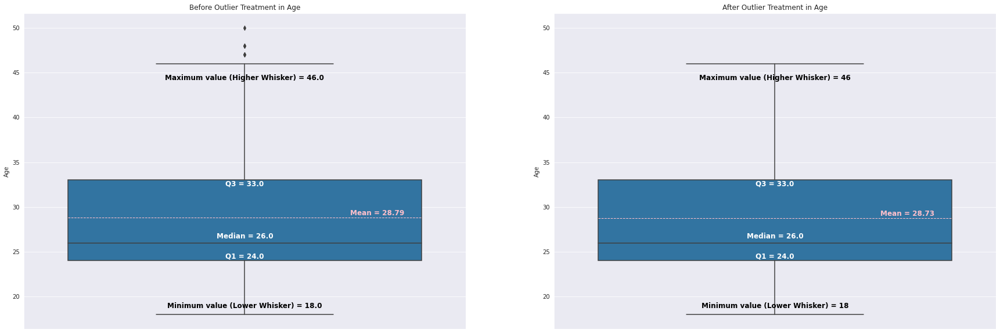

In [ ]:
# Visualizing the change in statistical characteristics of "Age"

fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax1 = sns.boxplot(data = original, y='Age',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Before Outlier Treatment in Age")

mode_age1 = original['Age'].mode().values

xtick1 = ax1.get_xticks()
ax1.text(xtick1,original_stats.loc['50%', 'Age']*1.02,"Median = " + str(original_stats.loc['50%', 'Age']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['25%', 'Age']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Age']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['75%', 'Age']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Age']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['upper_whisker', 'Age']*0.96,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Age']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1,original_stats.loc['lower_whisker', 'Age']*1.04,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Age']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1+.3,original_stats.loc['mean', 'Age']*1.01,"Mean = " + str(original_stats.loc['mean', 'Age']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')



plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data = temp_original, y='Age',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
ax2.set(ylim=ax1.get_ylim())
plt.title("After Outlier Treatment in Age")

twentyfifth2 = temp_original['Age'].quantile(.25)
median_age2 = temp_original['Age'].median()
seventyfifth2 = temp_original['Age'].quantile(.75)
iqr2 = seventyfifth2 - twentyfifth2
higherwhisker2 = temp_original.loc[temp_original['Age'] <= (seventyfifth2 + 1.5*iqr2), 'Age'].max()
lowerwhisker2 = temp_original.loc[temp_original['Age'] >= (twentyfifth2 - 1.5*iqr2), 'Age'].min()
mean_age2 = round(temp_original['Age'].mean(), 2)
mode_age2 = temp_original['Age'].mode().values

xtick2 = ax2.get_xticks()
ax2.text(xtick2,median_age2*1.02,"Median = " + str(median_age2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,twentyfifth2*1.01,"Q1 = " + str(twentyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,seventyfifth2*0.98,"Q3 = " + str(seventyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,higherwhisker2*0.96,"Maximum value (Higher Whisker) = " + str(higherwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2,lowerwhisker2*1.04,"Minimum value (Lower Whisker) = " + str(lowerwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2+.3,mean_age2*1.01,"Mean = " + str(mean_age2), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')


plt.show()

<p>
  <u><em>Technical Analysis 5.1</u>: -</em> From the above calculations and visualization we see that reseting the higher outliers to the Higher Whisker value did not change the Median, Q1, Q3, Higher Whisker, and Lower Whisker values. Also, Mean got  changed by a very small factor i.e. 0.06 years.
  
</p>

In [ ]:
# Flooring outliers for "Education" feature

temp_original.loc[temp_original['Education']>original_stats.loc['upper_whisker', 'Education'], 'Education'] = int(original_stats.loc['upper_whisker', 'Education'])

# Now there will be no Education greater than Higher Whisker value
len(temp_original.loc[temp_original['Education']>original_stats.loc['upper_whisker', 'Education'], 'Education'])

0

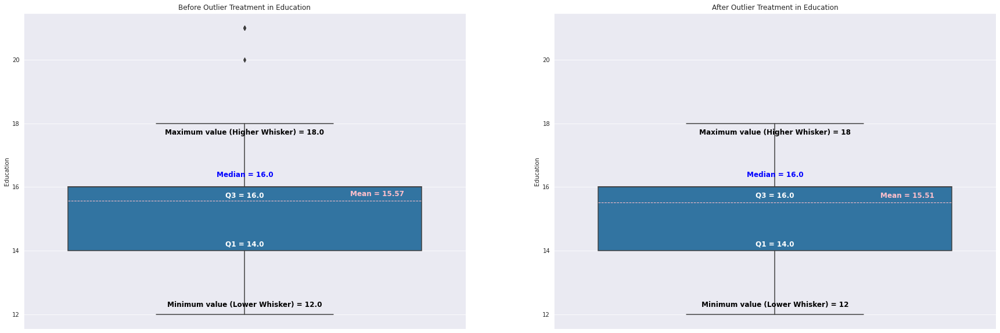

In [ ]:
# Visualizing the change in statistical characteristics of "Education"

fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax1 = sns.boxplot(data = original, y='Education',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Before Outlier Treatment in Education")

mode_Education1 = original['Education'].mode().values

xtick1 = ax1.get_xticks()
ax1.text(xtick1,original_stats.loc['50%', 'Education']*1.02,"Median = " + str(original_stats.loc['50%', 'Education']), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax1.text(xtick1,original_stats.loc['25%', 'Education']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Education']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['75%', 'Education']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Education']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['upper_whisker', 'Education']*0.98,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Education']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1,original_stats.loc['lower_whisker', 'Education']*1.02,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Education']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1+.3,original_stats.loc['mean', 'Education']*1.01,"Mean = " + str(original_stats.loc['mean', 'Education']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')



plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data = temp_original, y='Education',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
ax2.set(ylim=ax1.get_ylim())
plt.title("After Outlier Treatment in Education")

twentyfifth2 = temp_original['Education'].quantile(.25)
median_Education2 = temp_original['Education'].median()
seventyfifth2 = temp_original['Education'].quantile(.75)
iqr2 = seventyfifth2 - twentyfifth2
higherwhisker2 = temp_original.loc[temp_original['Education'] <= (seventyfifth2 + 1.5*iqr2), 'Education'].max()
lowerwhisker2 = temp_original.loc[temp_original['Education'] >= (twentyfifth2 - 1.5*iqr2), 'Education'].min()
mean_Education2 = round(temp_original['Education'].mean(), 2)
mode_Education2 = temp_original['Education'].mode().values

xtick2 = ax2.get_xticks()
ax2.text(xtick2,median_Education2*1.02,"Median = " + str(median_Education2), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax2.text(xtick2,twentyfifth2*1.01,"Q1 = " + str(twentyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,seventyfifth2*0.98,"Q3 = " + str(seventyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,higherwhisker2*0.98,"Maximum value (Higher Whisker) = " + str(higherwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2,lowerwhisker2*1.02,"Minimum value (Lower Whisker) = " + str(lowerwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2+.3,mean_Education2*1.01,"Mean = " + str(mean_Education2), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')


plt.show()


<p>
  <u><em>Technical Analysis 5.2</u>: -</em> From the above calculations and visualization we see that reseting the higher outliers to the Higher Whisker value did not change the Median, Q1, Q3, Higher Whisker, and Lower Whisker values. Also, Mean got decreased by a very small factor i.e. 0.06 years.
  
</p>

In [ ]:
# Flooring outliers for "Usage" feature

temp_original.loc[temp_original['Usage']>original_stats.loc['upper_whisker', 'Usage'], 'Usage'] = int(original_stats.loc['upper_whisker', 'Usage'])

# Now there will be no Usage greater than Higher Whisker value
len(temp_original.loc[temp_original['Usage']>original_stats.loc['upper_whisker', 'Usage'], 'Usage'])

0

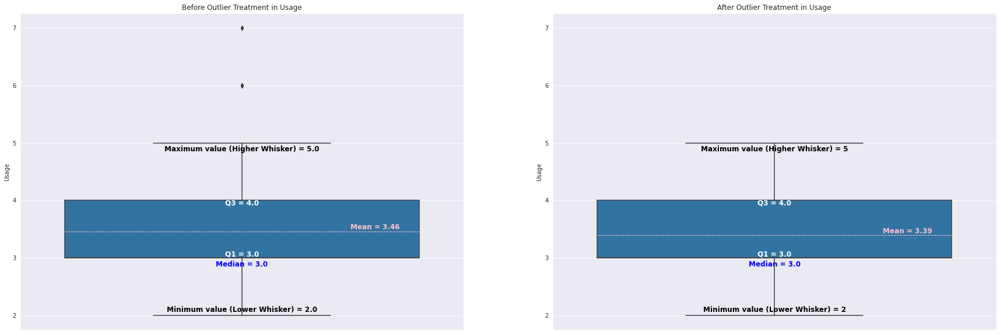

In [ ]:
# Visualizing the change in statistical characteristics of "Usage"

fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax1 = sns.boxplot(data = original, y='Usage',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Before Outlier Treatment in Usage")

mode_Usage1 = original['Usage'].mode().values

xtick1 = ax1.get_xticks()
ax1.text(xtick1,original_stats.loc['50%', 'Usage']*0.95,"Median = " + str(original_stats.loc['50%', 'Usage']), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax1.text(xtick1,original_stats.loc['25%', 'Usage']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Usage']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['75%', 'Usage']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Usage']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['upper_whisker', 'Usage']*0.97,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Usage']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1,original_stats.loc['lower_whisker', 'Usage']*1.03,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Usage']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1+.3,original_stats.loc['mean', 'Usage']*1.01,"Mean = " + str(original_stats.loc['mean', 'Usage']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')



plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data = temp_original, y='Usage',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
ax2.set(ylim=ax1.get_ylim())
plt.title("After Outlier Treatment in Usage")

twentyfifth2 = temp_original['Usage'].quantile(.25)
median_Usage2 = temp_original['Usage'].median()
seventyfifth2 = temp_original['Usage'].quantile(.75)
iqr2 = seventyfifth2 - twentyfifth2
higherwhisker2 = temp_original.loc[temp_original['Usage'] <= (seventyfifth2 + 1.5*iqr2), 'Usage'].max()
lowerwhisker2 = temp_original.loc[temp_original['Usage'] >= (twentyfifth2 - 1.5*iqr2), 'Usage'].min()
mean_Usage2 = round(temp_original['Usage'].mean(), 2)
mode_Usage2 = temp_original['Usage'].mode().values

xtick2 = ax2.get_xticks()
ax2.text(xtick2,median_Usage2*0.95,"Median = " + str(median_Usage2), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax2.text(xtick2,twentyfifth2*1.01,"Q1 = " + str(twentyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,seventyfifth2*0.98,"Q3 = " + str(seventyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,higherwhisker2*0.97,"Maximum value (Higher Whisker) = " + str(higherwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2,lowerwhisker2*1.03,"Minimum value (Lower Whisker) = " + str(lowerwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2+.3,mean_Usage2*1.01,"Mean = " + str(mean_Usage2), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')


plt.show()

<p>
  <u><em>Technical Analysis 5.3</u>: -</em> From the above calculations and visualization we see that reseting the higher outliers to the Higher Whisker value did not change the Median, Q1, Q3, Higher Whisker, and Lower Whisker values. Also, Mean got decreased by a very small factor i.e. 0.07 days/week.
  
</p>

In [ ]:
# Flooring outliers for "Fitness" feature

temp_original.loc[temp_original['Fitness']<original_stats.loc['lower_whisker', 'Fitness'], 'Fitness'] = int(original_stats.loc['lower_whisker', 'Fitness']+1)

# Now there will be no Fitness lower than Lower Whisker value
len(temp_original.loc[temp_original['Fitness']<original_stats.loc['lower_whisker', 'Fitness'], 'Fitness'])

0

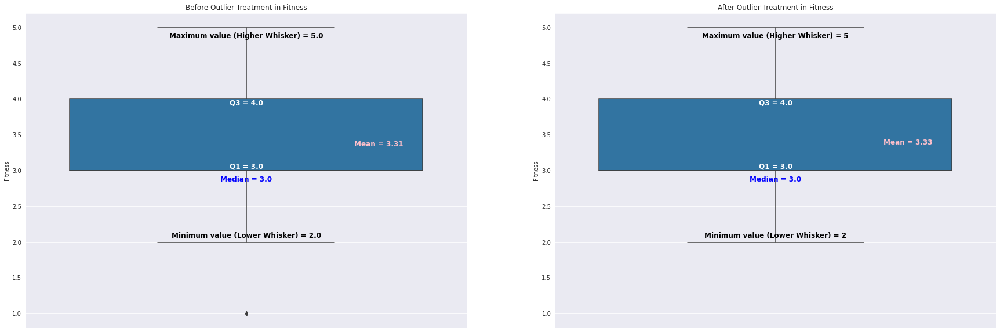

In [ ]:
# Visualizing the change in statistical characteristics of "Fitness"

fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax1 = sns.boxplot(data = original, y='Fitness',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Before Outlier Treatment in Fitness")

mode_Fitness1 = original['Fitness'].mode().values

xtick1 = ax1.get_xticks()
ax1.text(xtick1,original_stats.loc['50%', 'Fitness']*0.95,"Median = " + str(original_stats.loc['50%', 'Fitness']), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax1.text(xtick1,original_stats.loc['25%', 'Fitness']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Fitness']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['75%', 'Fitness']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Fitness']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['upper_whisker', 'Fitness']*0.97,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Fitness']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1,original_stats.loc['lower_whisker', 'Fitness']*1.03,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Fitness']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1+.3,original_stats.loc['mean', 'Fitness']*1.01,"Mean = " + str(original_stats.loc['mean', 'Fitness']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')



plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data = temp_original, y='Fitness',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
ax2.set(ylim=ax1.get_ylim())
plt.title("After Outlier Treatment in Fitness")

twentyfifth2 = temp_original['Fitness'].quantile(.25)
median_Fitness2 = temp_original['Fitness'].median()
seventyfifth2 = temp_original['Fitness'].quantile(.75)
iqr2 = seventyfifth2 - twentyfifth2
higherwhisker2 = temp_original.loc[temp_original['Fitness'] <= (seventyfifth2 + 1.5*iqr2), 'Fitness'].max()
lowerwhisker2 = temp_original.loc[temp_original['Fitness'] >= (twentyfifth2 - 1.5*iqr2), 'Fitness'].min()
mean_Fitness2 = round(temp_original['Fitness'].mean(), 2)
mode_Fitness2 = temp_original['Fitness'].mode().values

xtick2 = ax2.get_xticks()
ax2.text(xtick2,median_Fitness2*0.95,"Median = " + str(median_Fitness2), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax2.text(xtick2,twentyfifth2*1.01,"Q1 = " + str(twentyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,seventyfifth2*0.98,"Q3 = " + str(seventyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,higherwhisker2*0.97,"Maximum value (Higher Whisker) = " + str(higherwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2,lowerwhisker2*1.03,"Minimum value (Lower Whisker) = " + str(lowerwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2+.3,mean_Fitness2*1.01,"Mean = " + str(mean_Fitness2), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')


plt.show()

<p>
  <u><em>Technical Analysis 5.4</u>: -</em> From the above calculations and visualization we see that reseting the higher outliers to the Higher Whisker value did not change the Median, Q1, Q3, Higher Whisker, and Lower Whisker values. Also, Mean got increased by a very small factor i.e. 0.02.
  
</p>

In [ ]:
# Flooring outliers for "Income" feature

temp_original.loc[temp_original['Income']>original_stats.loc['upper_whisker', 'Income'], 'Income'] = int(original_stats.loc['upper_whisker', 'Income'])

# Now there will be no Income greater than Higher Whisker value
len(temp_original.loc[temp_original['Income']>original_stats.loc['upper_whisker', 'Income'], 'Income'])

0

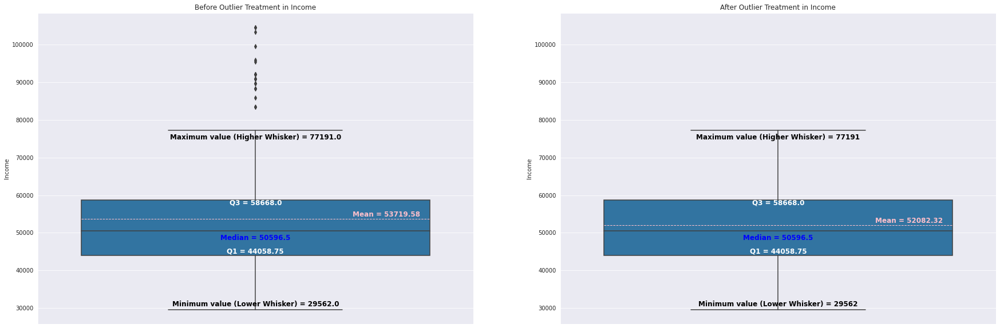

In [ ]:
# Visualizing the change in statistical characteristics of "Income"

fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax1 = sns.boxplot(data = original, y='Income',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Before Outlier Treatment in Income")

mode_Income1 = original['Income'].mode().values

xtick1 = ax1.get_xticks()
ax1.text(xtick1,original_stats.loc['50%', 'Income']*0.95,"Median = " + str(original_stats.loc['50%', 'Income']), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax1.text(xtick1,original_stats.loc['25%', 'Income']*1.01,"Q1 = " + str(original_stats.loc['25%', 'Income']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['75%', 'Income']*0.98,"Q3 = " + str(original_stats.loc['75%', 'Income']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['upper_whisker', 'Income']*0.97,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Income']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1,original_stats.loc['lower_whisker', 'Income']*1.03,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Income']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1+.3,original_stats.loc['mean', 'Income']*1.01,"Mean = " + str(original_stats.loc['mean', 'Income']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')



plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data = temp_original, y='Income',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
ax2.set(ylim=ax1.get_ylim())
plt.title("After Outlier Treatment in Income")

twentyfifth2 = temp_original['Income'].quantile(.25)
median_Income2 = temp_original['Income'].median()
seventyfifth2 = temp_original['Income'].quantile(.75)
iqr2 = seventyfifth2 - twentyfifth2
higherwhisker2 = temp_original.loc[temp_original['Income'] <= (seventyfifth2 + 1.5*iqr2), 'Income'].max()
lowerwhisker2 = temp_original.loc[temp_original['Income'] >= (twentyfifth2 - 1.5*iqr2), 'Income'].min()
mean_Income2 = round(temp_original['Income'].mean(), 2)
mode_Income2 = temp_original['Income'].mode().values

xtick2 = ax2.get_xticks()
ax2.text(xtick2,median_Income2*0.95,"Median = " + str(median_Income2), 
        horizontalalignment='center',size='large',color='b',weight='semibold')
ax2.text(xtick2,twentyfifth2*1.01,"Q1 = " + str(twentyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,seventyfifth2*0.98,"Q3 = " + str(seventyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,higherwhisker2*0.97,"Maximum value (Higher Whisker) = " + str(higherwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2,lowerwhisker2*1.03,"Minimum value (Lower Whisker) = " + str(lowerwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2+.3,mean_Income2*1.01,"Mean = " + str(mean_Income2), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')


plt.show()

<p>
  <u><em>Technical Analysis 5.5</u>: -</em> From the above calculations and visualization we see that reseting the higher outliers to the Higher Whisker value did not change the Median, Q1, Q3, Higher Whisker, and Lower Whisker values. Also, Mean got decreased by a very small factor i.e. $1,637.26 compared to the value of standard daviation.
  
</p>

In [ ]:
# Flooring outliers for "Miles" feature

temp_original.loc[temp_original['Miles']>original_stats.loc['upper_whisker', 'Miles'], 'Miles'] = int(original_stats.loc['upper_whisker', 'Miles'])

# Now there will be no Miles greater than Higher Whisker value
len(temp_original.loc[temp_original['Miles']>original_stats.loc['upper_whisker', 'Miles'], 'Miles'])

0

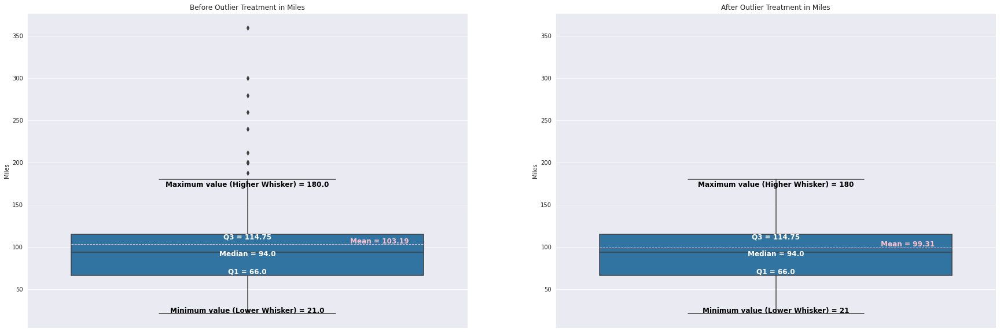

In [ ]:
# Visualizing the change in statistical characteristics of "Miles"

fig = plt.figure(figsize = (30,10))

plt.subplot(1, 2, 1)
ax1 = sns.boxplot(data = original, y='Miles',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
plt.title("Before Outlier Treatment in Miles")

mode_Miles1 = original['Miles'].mode().values

xtick1 = ax1.get_xticks()
ax1.text(xtick1,original_stats.loc['50%', 'Miles']*0.95,"Median = " + str(original_stats.loc['50%', 'Miles']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['25%', 'Miles']*1.03,"Q1 = " + str(original_stats.loc['25%', 'Miles']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['75%', 'Miles']*0.95,"Q3 = " + str(original_stats.loc['75%', 'Miles']), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax1.text(xtick1,original_stats.loc['upper_whisker', 'Miles']*0.95,"Maximum value (Higher Whisker) = " + str(original_stats.loc['upper_whisker', 'Miles']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1,original_stats.loc['lower_whisker', 'Miles']*1.05,"Minimum value (Lower Whisker) = " + str(original_stats.loc['lower_whisker', 'Miles']), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax1.text(xtick1+.3,original_stats.loc['mean', 'Miles']*1.01,"Mean = " + str(original_stats.loc['mean', 'Miles']), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')



plt.subplot(1, 2, 2)
ax2 = sns.boxplot(data = temp_original, y='Miles',
                 meanline=True, showmeans=True, meanprops={'color': 'pink'})
ax2.set(ylim=ax1.get_ylim())
plt.title("After Outlier Treatment in Miles")

twentyfifth2 = temp_original['Miles'].quantile(.25)
median_Miles2 = temp_original['Miles'].median()
seventyfifth2 = temp_original['Miles'].quantile(.75)
iqr2 = seventyfifth2 - twentyfifth2
higherwhisker2 = temp_original.loc[temp_original['Miles'] <= (seventyfifth2 + 1.5*iqr2), 'Miles'].max()
lowerwhisker2 = temp_original.loc[temp_original['Miles'] >= (twentyfifth2 - 1.5*iqr2), 'Miles'].min()
mean_Miles2 = round(temp_original['Miles'].mean(), 2)
mode_Miles2 = temp_original['Miles'].mode().values

xtick2 = ax2.get_xticks()
ax2.text(xtick2,median_Miles2*0.95,"Median = " + str(median_Miles2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,twentyfifth2*1.03,"Q1 = " + str(twentyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,seventyfifth2*0.95,"Q3 = " + str(seventyfifth2), 
        horizontalalignment='center',size='large',color='w',weight='semibold')
ax2.text(xtick2,higherwhisker2*0.95,"Maximum value (Higher Whisker) = " + str(higherwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2,lowerwhisker2*1.05,"Minimum value (Lower Whisker) = " + str(lowerwhisker2), 
        horizontalalignment='center',size='large',color='black',weight='semibold')
ax2.text(xtick2+.3,mean_Miles2*1.01,"Mean = " + str(mean_Miles2), 
        horizontalalignment='center',size='large',color='pink',weight='semibold')


plt.show()


<p>
  <u><em>Technical Analysis 5.6</u>: -</em> From the above calculations and visualization we see that reseting the higher outliers to the Higher Whisker value did not change the Median, Q1, Q3, Higher Whisker, and Lower Whisker values. Also, Mean got decreased by a very small factor i.e. 3.98 miles compared to the value of standard daviation.
  
</p>

In [ ]:
# Since out outlier treatment was satisfactory
# We'll keep these changes

original = temp_original.copy(deep=True)

# 6. Binning Numerical Data

<p>
  <u><em>Workflow</u>: -</em> The general approach will be to perfom binning for numerical data AND simultaniously categorizing outliers to be part of the maximum category which has upper limit same as the higher whisker value.
</p>

In [ ]:
original_stats

,Age,Education,Usage,Fitness,Income,Miles
count,180.000000,180.000000,180.000000,180.000000,180.000000,180.000000
mean,28.790000,15.570000,3.460000,3.310000,53719.580000,103.190000
std,6.943498,1.617055,1.084797,0.958869,16506.684226,51.863605
min,18.000000,12.000000,2.000000,1.000000,29562.000000,21.000000
25%,24.000000,14.000000,3.000000,3.000000,44058.750000,66.000000
50%,26.000000,16.000000,3.000000,3.000000,50596.500000,94.000000
75%,33.000000,16.000000,4.000000,4.000000,58668.000000,114.750000
max,50.000000,21.000000,7.000000,5.000000,104581.000000,360.000000
iqr,9.000000,2.000000,1.000000,1.000000,14609.250000,48.750000
upper_whisker,46.000000,18.000000,5.000000,5.000000,77191.000000,180.000000


In [ ]:
# Creating bins for Age

# Since standard daviation for Age = 6.94 years,
# we'll create bins with size = 7 years
std_age = math.ceil(original_stats.loc['std', 'Age'])
min_age = math.floor(original_stats.loc['min', 'Age'])
max_age = math.ceil(original['Age'].max())
print(std_age, min_age, max_age)

multiply = np.array([0, 1, 2, 3])
range_age = list(min_age+(std_age*multiply)) + [max_age+1]

original['Age_binned'] = pd.cut(original['Age'], bins=range_age, right=False, include_lowest=True)
original.head()

7 18 46


,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,Age_binned
0,KP281,18,Male,14,Single,3,4,29562,112,"[18, 25)"
1,KP281,19,Male,15,Single,2,3,31836,75,"[18, 25)"
2,KP281,19,Female,14,Partnered,4,3,30699,66,"[18, 25)"
3,KP281,19,Male,12,Single,3,3,32973,85,"[18, 25)"
4,KP281,20,Male,13,Partnered,4,2,35247,47,"[18, 25)"


In [ ]:
# Checking our categories after age binning
original['Age_binned'].value_counts()

[25, 32)    72
[18, 25)    54
[32, 39)    36
[39, 47)    18
Name: Age_binned, dtype: int64

In [ ]:
# Creating bins for Education

# We'll bin Education as follows -
def education_bins(value):
  if value < 10:
    return "Uneducated"
  elif 10 <= value < 12:
    return "SSC"
  elif 12 <= value < 14:
    return "HSC"
  elif 14 <= value < 16:
    return "Diploma"
  elif 16 <= value < 18:
    return "Undergraduate"
  else:
    return "Postgraduate"

original['Education_binned'] = original['Education'].apply(education_bins)
original.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,Age_binned,Education_binned
0,KP281,18,Male,14,Single,3,4,29562,112,"[18, 25)",Diploma
1,KP281,19,Male,15,Single,2,3,31836,75,"[18, 25)",Diploma
2,KP281,19,Female,14,Partnered,4,3,30699,66,"[18, 25)",Diploma
3,KP281,19,Male,12,Single,3,3,32973,85,"[18, 25)",HSC
4,KP281,20,Male,13,Partnered,4,2,35247,47,"[18, 25)",HSC


In [ ]:
# Checking our categories after Education binning
original['Education_binned'].value_counts()

Undergraduate    85
Diploma          60
Postgraduate     27
HSC               8
Name: Education_binned, dtype: int64

In [ ]:
# Creating bins for Usage

def usage_bins(value):
  if value <= 2:
    return "Low"
  elif 2 < value <= 4:
    return "Moderate"
  else:
    return "High"

original['Usage_binned'] = original['Usage'].apply(usage_bins)
original.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,Age_binned,Education_binned,Usage_binned
0,KP281,18,Male,14,Single,3,4,29562,112,"[18, 25)",Diploma,Moderate
1,KP281,19,Male,15,Single,2,3,31836,75,"[18, 25)",Diploma,Low
2,KP281,19,Female,14,Partnered,4,3,30699,66,"[18, 25)",Diploma,Moderate
3,KP281,19,Male,12,Single,3,3,32973,85,"[18, 25)",HSC,Moderate
4,KP281,20,Male,13,Partnered,4,2,35247,47,"[18, 25)",HSC,Moderate


In [ ]:
# Checking our categories after Usage binning
original['Usage_binned'].value_counts()

Moderate    121
Low          33
High         26
Name: Usage_binned, dtype: int64

In [ ]:
# Creating bins for Income

# Since standard daviation for Income = $17000,
# we'll create bins with size = $17000
std_income = round(math.ceil(original_stats.loc['std', 'Income']), -3)
min_income = math.floor(original_stats.loc['min', 'Income']) - math.floor(original_stats.loc['min', 'Income'])%1000
max_income = round(math.ceil(original['Income'].max()), -3) + 1000
print(std_income, min_income, max_income)

multiply = np.array([0, 1, 2])
range_income = list(min_income+(std_income*multiply)) + [max_income+1]

original['Income_binned'] = pd.cut(original['Income'], bins=range_income, right=False, include_lowest=True)
original.head()

17000 29000 78000


,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,Age_binned,Education_binned,Usage_binned,Income_binned
0,KP281,18,Male,14,Single,3,4,29562,112,"[18, 25)",Diploma,Moderate,"[29000, 46000)"
1,KP281,19,Male,15,Single,2,3,31836,75,"[18, 25)",Diploma,Low,"[29000, 46000)"
2,KP281,19,Female,14,Partnered,4,3,30699,66,"[18, 25)",Diploma,Moderate,"[29000, 46000)"
3,KP281,19,Male,12,Single,3,3,32973,85,"[18, 25)",HSC,Moderate,"[29000, 46000)"
4,KP281,20,Male,13,Partnered,4,2,35247,47,"[18, 25)",HSC,Moderate,"[29000, 46000)"


In [ ]:
original['Income_binned'].value_counts()

[46000, 63000)    84
[29000, 46000)    63
[63000, 78001)    33
Name: Income_binned, dtype: int64

In [ ]:
# Creating bins for Miles

# Since standard daviation for Miles = 50 miles,
# we'll create bins with size = 50 miles
std_miles = round(math.ceil(original_stats.loc['std', 'Miles']), -1)
min_miles = round(math.floor(max(original_stats.loc['lower_whisker', 'Miles'], original['Miles'].min())), -1)
max_miles = round(math.ceil(original_stats.loc['upper_whisker', 'Miles']), -1)
print(std_miles, min_miles, max_miles)

# original['Miles_binned'] = original['Miles'].apply(lambda x: create_bins(round(x, -1), std_miles, min_miles, max_miles))
# original.head()
multiply = np.array([0, 1, 2])
range_miles = list(min_miles+(std_miles*multiply)) + [max_miles+1]

original['Miles_binned'] = pd.cut(original['Miles'], bins=range_miles, right=False, include_lowest=True)
original.head()

50 20 180


,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,Age_binned,Education_binned,Usage_binned,Income_binned,Miles_binned
0,KP281,18,Male,14,Single,3,4,29562,112,"[18, 25)",Diploma,Moderate,"[29000, 46000)","[70, 120)"
1,KP281,19,Male,15,Single,2,3,31836,75,"[18, 25)",Diploma,Low,"[29000, 46000)","[70, 120)"
2,KP281,19,Female,14,Partnered,4,3,30699,66,"[18, 25)",Diploma,Moderate,"[29000, 46000)","[20, 70)"
3,KP281,19,Male,12,Single,3,3,32973,85,"[18, 25)",HSC,Moderate,"[29000, 46000)","[70, 120)"
4,KP281,20,Male,13,Partnered,4,2,35247,47,"[18, 25)",HSC,Moderate,"[29000, 46000)","[20, 70)"


In [ ]:
original['Miles_binned'].value_counts()

[70, 120)     89
[20, 70)      46
[120, 181)    45
Name: Miles_binned, dtype: int64

In [ ]:
# Sanity checking if there were any nulls introduced
original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 180 entries, 0 to 179
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   Product           180 non-null    object  
 1   Age               180 non-null    int64   
 2   Gender            180 non-null    object  
 3   Education         180 non-null    int64   
 4   MaritalStatus     180 non-null    object  
 5   Usage             180 non-null    int64   
 6   Fitness           180 non-null    int64   
 7   Income            180 non-null    int64   
 8   Miles             180 non-null    int64   
 9   Age_binned        180 non-null    category
 10  Education_binned  180 non-null    object  
 11  Usage_binned      180 non-null    object  
 12  Income_binned     180 non-null    category
 13  Miles_binned      180 non-null    category
dtypes: category(3), int64(6), object(5)
memory usage: 16.7+ KB


<p>
  <u><em>General Analysis 5.1</u>: -</em> From the above calculations we get -
  <ul>
    <li>4 Age Bins, namely->
      <ul>
        <li>18 - 24 => [18, 25)</li>
        <li>25 - 31 => [25, 32)</li>
        <li>32 - 38 => [32, 39)</li>
        <li>39 - 46 => [39, 47)</li>
      </ul>
    </li>
    <li>4 Education Bins, namely->
      <ul>
        <li>HSC</li>
        <li>Diploma</li>
        <li>Undergraduate</li>
        <li>Postgraduate</li>
      </ul>
    </li>
    <li>3 Usage Bins, namely->
      <ul>
        <li>Low</li>
        <li>Moderate</li>
        <li>High</li>
      </ul>
    </li>
    <li>3 Income Bins, namely->
      <ul>
        <li>30000 - 46999 => [30000, 47000)</li>
        <li>47000 - 63999 => [47000, 64000)</li>
        <li>64000 - 78000 => [64000, 78001)</li>
      </ul>
    </li>
    <li>4 Miles Bins, namely->
      <ul>
        <li>20 - 69 => [20, 70)</li>
        <li>70 - 119 => [70, 120)</li>
        <li>120 - 180 => [120, 181)</li>
      </ul>
    </li>
  </ul>
</p>

# 7. Graphical Analysis 1: With Correlation

In [ ]:
original.head()

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,Age_binned,Education_binned,Usage_binned,Income_binned,Miles_binned
0,KP281,18,Male,14,Single,3,4,29562,112,"[18, 25)",Diploma,Moderate,"[29000, 46000)","[70, 120)"
1,KP281,19,Male,15,Single,2,3,31836,75,"[18, 25)",Diploma,Low,"[29000, 46000)","[70, 120)"
2,KP281,19,Female,14,Partnered,4,3,30699,66,"[18, 25)",Diploma,Moderate,"[29000, 46000)","[20, 70)"
3,KP281,19,Male,12,Single,3,3,32973,85,"[18, 25)",HSC,Moderate,"[29000, 46000)","[70, 120)"
4,KP281,20,Male,13,Partnered,4,2,35247,47,"[18, 25)",HSC,Moderate,"[29000, 46000)","[20, 70)"


In [ ]:
# Creating a generalized function to add values on top of bars for a
# bar/count plot
def add_bar_label(ax, data_per_bar, decimal=0, offset=[0, 0], color='black', rotation='horizontal'):
  '''
  Adds text on top of bars of a bar chart.

  Parameters:
  ax (matplotlib.axes._subplots.AxesSubplot) :Axis of matplotlib.
  data_per_bar (pandas.core.series.Series)   :Series containing text to show on
                                              bars.
  decimal (integer)                          :Rounding off text to these many
                                              places.

  Returns:
  NoneType
  '''

  # resetting index of data in data_per_bar to x-tick values
  data_per_bar.index = data_per_bar.reindex(ax.get_xticks()).index

  # iterating over data_per_bar, which now contains x co-ordinate of bars and
  # the corresponding value to show on the bars
  second_yticks = ax.get_yticks()[1]
  for index, row in data_per_bar.iteritems():
    # dynamic colour assignment, if on bar then 'white' if outside bar then
    # 'black'
    value = round(row, decimal) if type(row)==type(1.0) else row
    colour = color if (color!='black') else 'black' if (second_yticks >= (row - 3)) else 'white'
    # x = index, y = second y_ticks value, row is the value to show on bars
    ax.text(index+offset[0], second_yticks+offset[1], value,
              color=colour, ha='center', fontweight='bold', fontsize='large', rotation=rotation)

In [ ]:
# Generic function to add text to minimum value and maximum value on lineplot
def add_min_max_label(ax, data, offset=[0,0], color='black'):
  min_val = data.iloc[-1]
  min_at = data.index[-1]
  max_val = data.iloc[0]
  max_at = data.index[0]

  xticks = ax.get_xticks()
  yticks = ax.get_yticks()
  xticks_diff = xticks[1] - xticks[0]
  yticks_diff = yticks[1] - yticks[0]

  if isinstance(data.index[0], datetime):
    ax.text(ax.get_xticks()[1+offset[0]] + xticks_diff/2,
            ax.get_yticks()[-(3+offset[1])],
            "Min @ " + str(min_at.year) + "-" + str(min_at.month_name()) + " = " + str(min_val), color = color, fontweight='bold')
    ax.text(ax.get_xticks()[1+offset[0]] + xticks_diff/2,
            ax.get_yticks()[-(3+offset[1])] - yticks_diff/2,
            "Max @ " + str(max_at.year) + "-" + str(max_at.month_name()) + " = " + str(max_val), color = color, fontweight='bold')
  else:
    ax.text(ax.get_xticks()[1+offset[0]] + xticks_diff/2,
            ax.get_yticks()[-(3+offset[1])],
            "Min @ " + str(min_at) + " = " + str(min_val), color = color, fontweight='bold')
    ax.text(ax.get_xticks()[1+offset[0]] + xticks_diff/2,
            ax.get_yticks()[-(3+offset[1])] - yticks_diff/2,
            "Max @ " + str(max_at) + " = " + str(max_val), color = color, fontweight='bold')


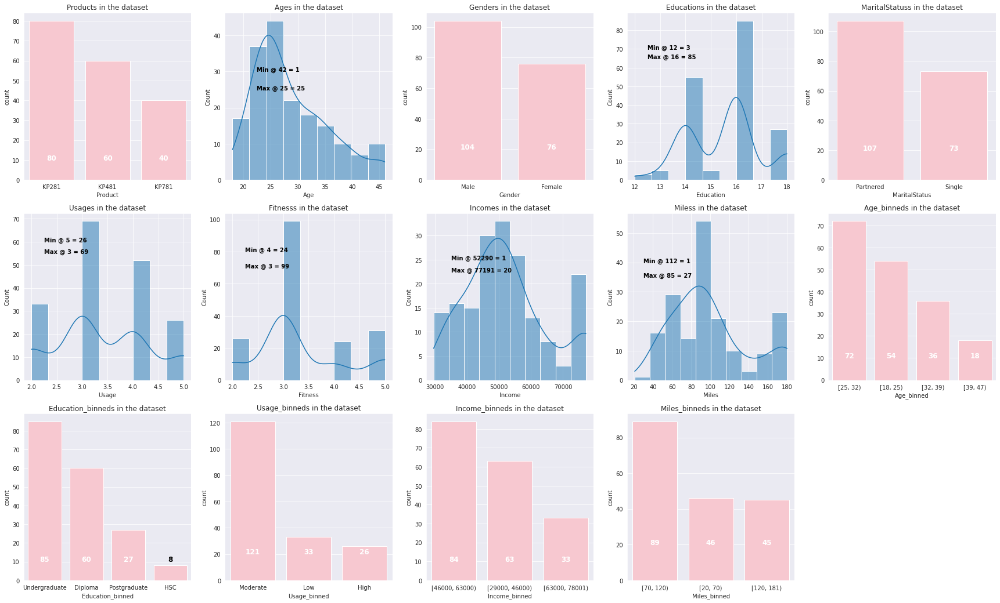

In [ ]:
# Creating basic plots for the numerical and categorical variables in our dataset
# 1 variable (categorical/numerical)
fig = plt.figure(figsize=(30, 18))

numerical_dtype = original['Age'].dtype

for i, col in enumerate(original.columns):
  plt.subplot(3, 5, i+1)
  if original[col].dtype == numerical_dtype:
    ax = sns.histplot(data=original, x=col, kde=True)
    add_min_max_label(ax, original[col].value_counts())
    plt.title(col + "s in the dataset")
  else:
    ax = sns.countplot(data=original, x=col,
                       order=original[col].value_counts().index,
                       color='pink')
    add_bar_label(ax, original[col].value_counts(), 0)
    plt.title(col + "s in the dataset")

<p>
  <u><em>General Analysis 7.1</u>: -</em> From the above representataion we get -
  <ul>
    <li>The most popular product is KP281, then there is KP481, then KP781.</li>
    <li>The Age in most of our data is concentrated around 25 to 31 years. That means that vibha_gmc mostly has young customers.</li>
    <li>Vibha-GMC has more male customers than female.</li>
    <li>Most of the customers have a 16-17 years of education background, i.e. Undergraduates are more likely to become Vibha-GMC's customer.</li>
    <li>Vibha-GMC has more partnered customers than those with single marital status.</li>
    <li>Most of the customers intend to use the trademil thrice a week.</li>
    <li>Most of the customers have given themselves a moderate fitness rating.</li>
    <li>Most of the customers lie in the income range of $46000 - $63000.</li>
    <li>Most of Vibha-GMC's customers claim to run 70 to 120 miles per week.</li>
  </ul>
</p>

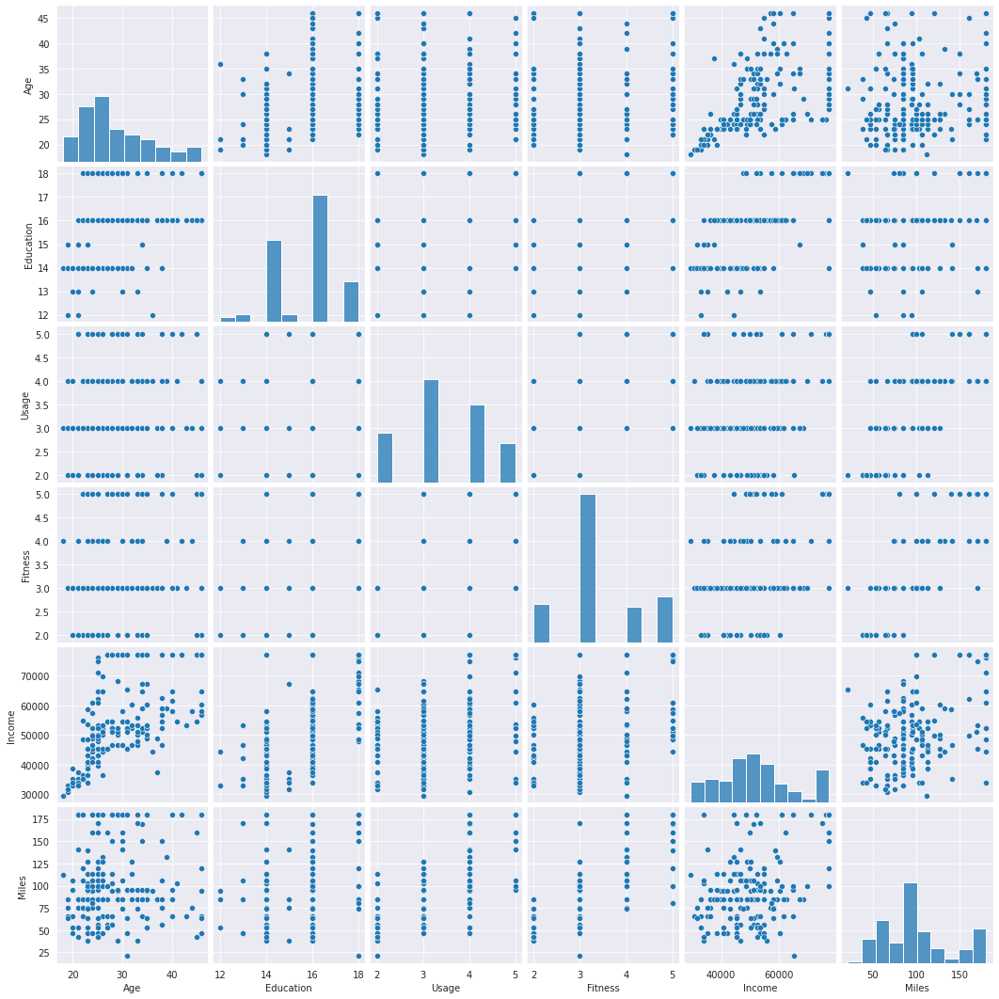

In [ ]:
# Checking pairwise relation between every two possible numerical variable
sns.pairplot(data=original)

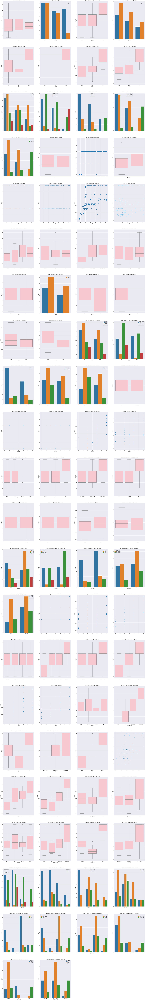

In [ ]:
# Creating basic plots for the numerical and categorical variables in our dataset
# 2 variables (both categorical/ one categorical one numerical/ both numerical)
fig = plt.figure(figsize=(45, 400))

numerical_dtype = original['Age'].dtype
count = 0

for i, col1 in enumerate(original.columns):
  for j,col2 in enumerate(original.columns):
    if (col1 != col2) & (i < j) & (col1.find(col2) == -1) & (col2.find(col1) == -1):
      count += 1
      plt.subplot(27, 4, count)
      # both categorical
      if ((original[col1].dtype != numerical_dtype) & (original[col2].dtype != numerical_dtype)):
        ax = sns.countplot(data=original, x=col1, hue=col2)
        plt.title(col1 + ' - ' + col2 + " relation in the dataset")
      # both numerical
      elif ((original[col1].dtype == numerical_dtype) & (original[col2].dtype == numerical_dtype)):
        ax = sns.scatterplot(data=original, x=col1, y=col2)
        plt.title(col1 + ' - ' + col2 + " relation in the dataset")
      # first categorical and second numerical
      elif ((original[col1].dtype != numerical_dtype) & (original[col2].dtype == numerical_dtype)):
        ax = sns.boxplot(data=original, y=col2, x=col1,
                          color='pink')
        plt.title(col1 + ' - ' + col2 + " relation in the dataset")
      # first numerical and second categorical
      else:
        ax = sns.boxplot(data=original, y=col1, x=col2,
                          color='pink')
        plt.title(col1 + ' - ' + col2 + " relation in the dataset")

<p>
  <u><em>General Analysis 7.2</u>: -</em> From the above representataion we get -
  <ul>
    <li>The age median age for customers who purchase KP781 model, is higher than the other 2 products.</li>
    <li>The minimum age of customers who purchase KP481 is greater than those who purchase KP281, and the minimum age of customers who purchased KP781 is higher than those who purchased KP481.</li>
    <li>The spread for customers who purchased KP781 product is compact as compared to other customers. This means that it is easier to identify those customers who might buy KP781 model, based on their ages.</li>
    <li>Approximately equal number of males and female purchase KP281 and KP481. More customers of KP781 are male as compared to female.</li>
    <li>50% of customers who bought KP781 have more than 16 years of education background. This could mean that there is more possibility of a customer with higher than 16 years of education to buy KP781 product.</li>
    <li>Customers who run/walk 3 to 3.5 days/week tend to buy KP481 model. Whereas 50% customers who run/walk atleast 4 days/week tend to buy KP781 model.</li>
    <li>75% of customers who run less than 4 days/week tend to buy KP281.</li>
    <li>Most pople who report fitness level as more than 3 tend to buy KP781. Generally, a customer who has reported fitness level as 3 tends to buy KP281 or KP481.</li>
    <li><b>We see the minimum and median incomes are more for costlier products, i.e. Income for people who buy KP781 > Income for people who buy KP481 > Income for people who buy KP281.</b></li>
    <li><b>The median income is very high for customers who bought KP781 model, this means that we can expect customers with > $75000 to buy KP781 product.</b></li>
    <li>People who run/walk > 120 miles tend to buy KP781 product.</li>
    <li>As expected, people with MaritalStatus as "Partnered" have more minimum, 25%, median, 75% and maximum age. As compared to people with MaritalStatus as "Single".</li>
    <li><b>There is a strong increasing trend/positive relation between Age and Income.</b></li>
    <li><b>There is a week positive relation between Age and Income<.</b></li>
    <li>Customers below the age of 25 years are exected to have income between $29000 and $46000.</li>
    <li>We have more "Partnered" males and females than "Single" males and females.</li>
    <li>The spread of Usage is bigger for Males than Females.</li>
    <li><b>In the dataset females are expected to have lower income then males.</b> We can see this from the "Gender-Income relationin the dataset" plot.</li>
    <li>Females are expected to run/walk less miles as compared to Males.</li>
    <li>Customers with higher years of education tend to earn more</li>
    <li>"Single" customers tend to have lesser salary than "Partnered" customer.</li>
    <li>In general single people tend to cover more miles as compared to partnered people.</li>
    <li>Most of the customers are Partnered and in the age group of 25 to 32 years.</li>
    <li>Customers with eudcation of "Diploma" tend to use the trademill less as compared to customers with other education background. Whereas, customers with education of "Postgraduate" tend to use the trademill the most.</li>
    <li><b>More educated people tend to have higher fitness. This means that the more educated a customer is the more are they self-aware of their fitness.</b></li>
    <li><b>Income tends to increase with increase in Age.</b></li>
    <li><b>Customers in age range 18 to 24 years tend to earn $29000 to $63000. They are not expected to earn more than $63000. Whereas, customers in age group 39 to 46 years tend to earn more than $63000, from the data in our dataset.</b></li>
  </ul>
</p>

In [ ]:
# Creating basic plots for the numerical and categorical variables in our dataset
# 3 variables (all categorical/ one categorical 2 numerical/ 2 categorical one numerical/ all numerical)
fig = plt.figure(figsize=(45, 800))

numerical_dtype = original['Age'].dtype
count = 0

for i, col1 in enumerate(original.columns):
  for j,col2 in enumerate(original.columns):
    for k,col3 in enumerate(original.columns):
      if (col1 != col2 != col3) & (i < j < k) & (col1.find(col2) == -1) & (col2.find(col1) == -1) & (col2.find(col3) == -1) & (col3.find(col2) == -1) & (col1.find(col3) == -1) & (col3.find(col1) == -1):
        # 2 categorical one numerical
        if ((original[col1].dtype != numerical_dtype) & (original[col2].dtype != numerical_dtype) & (original[col3].dtype == numerical_dtype)):
          count += 1
          plt.subplot(92, 4, count)
          ax = sns.barplot(data=original, x=col1, hue=col2, y=col3)
          plt.title(col1 + ' - ' + col2 + ' - ' + col3 + " relation in the dataset")
        elif ((original[col1].dtype == numerical_dtype) & (original[col2].dtype != numerical_dtype) & (original[col3].dtype != numerical_dtype)):
          count += 1
          plt.subplot(92, 4, count)
          ax = sns.barplot(data=original, x=col3, hue=col2, y=col1)
          plt.title(col1 + ' - ' + col2 + ' - ' + col3 + " relation in the dataset")
        elif ((original[col1].dtype != numerical_dtype) & (original[col2].dtype == numerical_dtype) & (original[col3].dtype != numerical_dtype)):
          count += 1
          plt.subplot(92, 4, count)
          ax = sns.barplot(data=original, x=col1, hue=col3, y=col2)
          plt.title(col1 + ' - ' + col2 + ' - ' + col3 + " relation in the dataset")
        # one categorical 2 numerical
        elif ((original[col1].dtype != numerical_dtype) & (original[col2].dtype == numerical_dtype) & (original[col3].dtype == numerical_dtype)):
          count += 1
          plt.subplot(92, 4, count)
          ax = sns.scatterplot(data=original, x=col3, y=col2, hue=col1)
          plt.title(col1 + ' - ' + col2 + ' - ' + col3 + " relation in the dataset")
        elif ((original[col1].dtype == numerical_dtype) & (original[col2].dtype != numerical_dtype) & (original[col3].dtype == numerical_dtype)):
          count += 1
          plt.subplot(92, 4, count)
          ax = sns.scatterplot(data=original, x=col3, y=col1, hue=col2)
          plt.title(col1 + ' - ' + col2 + ' - ' + col3 + " relation in the dataset")
        elif ((original[col1].dtype == numerical_dtype) & (original[col2].dtype == numerical_dtype) & (original[col3].dtype != numerical_dtype)):
          count += 1
          plt.subplot(92, 4, count)
          ax = sns.scatterplot(data=original, x=col1, y=col2, hue=col3)
          plt.title(col1 + ' - ' + col2 + ' - ' + col3 + " relation in the dataset")
        # all numerical
        elif ((original[col1].dtype == numerical_dtype) & (original[col2].dtype == numerical_dtype) & (original[col3].dtype == numerical_dtype)):
          count += 1
          plt.subplot(92, 4, count)
          ax = sns.scatterplot(data=original, y=col1, x=col2, size=col3)
          plt.title(col1 + ' - ' + col2 + ' - ' + col3 + " relation in the dataset")

<p>
  <u><em>General Analysis 7.3</u>: -</em> From the above representataion we get -
  <ul>
    <li>Customers with Education = "HSC" never buy KP781 product.</li>
    <li>Customers who claim to have low usage never buy KP781 product.</li>
    <li>Customers who have low miles coverage never buy KP781 product.</li>
    <li>Customer who claim to have low fitness never buy KP781 product.</li>
    <li>There is a positive relation between income and age for both, males and females.</li>
    <li>The age for single female is greater than single male. Whereas the age of partnered male is greater than partnered female.</li>
  </ul>
</p>

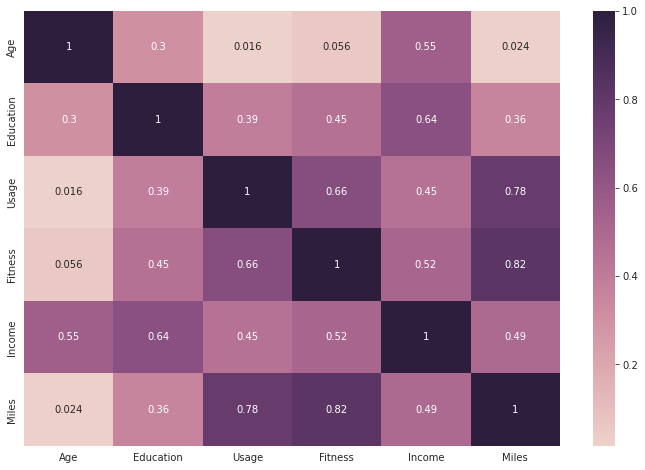

In [ ]:
# Checking correlation between features of our dataset with heatmaps
fig = plt.figure(figsize=(12, 8))

sns.heatmap(original.corr(), cmap=sns.cubehelix_palette(as_cmap=True), annot=True)
plt.show()

<p>
  <u><em>General Analysis 7.4</u>: -</em> In general, <b> 0-0.19 is regarded as very weak or no correlation, 0.2-0.39 as weak, 0.40-0.59 as moderate, 0.6-0.79 as strong and 0.8-1 as very strong correlation </b>. From the above representation, we can strengthen our previous inferrations -
  <ul>
    <li>There is a weak correlation between "Age" and "Education".</li>
    <li>There is a moderate correlation betweeen "Age" and "Income".</li>
    <li>There is a weak correlation between "Education" and "Usage".</li>
    <li>There is a moderate correlation between "Education" and "Fitness".</li>
    <li>There is a strong correlation between "Education" and "Income".</li>
    <li>There is a weak correlation between "Education" and "Miles".</li>
    <li>There is a strong correlation between "Usage" and "Fitness".</li>
    <li>There is a moderate correlation between "Usage" and "Income"</li>
    <li>There is a strong correlation between "Usage" and "Miles".</li>
    <li>There is a moderate correlation between "Fitness" and "Income"</li>
    <li>There is a very strong correlation between "Fitness" and "Miles".</li>
    <li>There is a moderate correlation between "Income" and "Miles".</li>
  </ul>
</p>

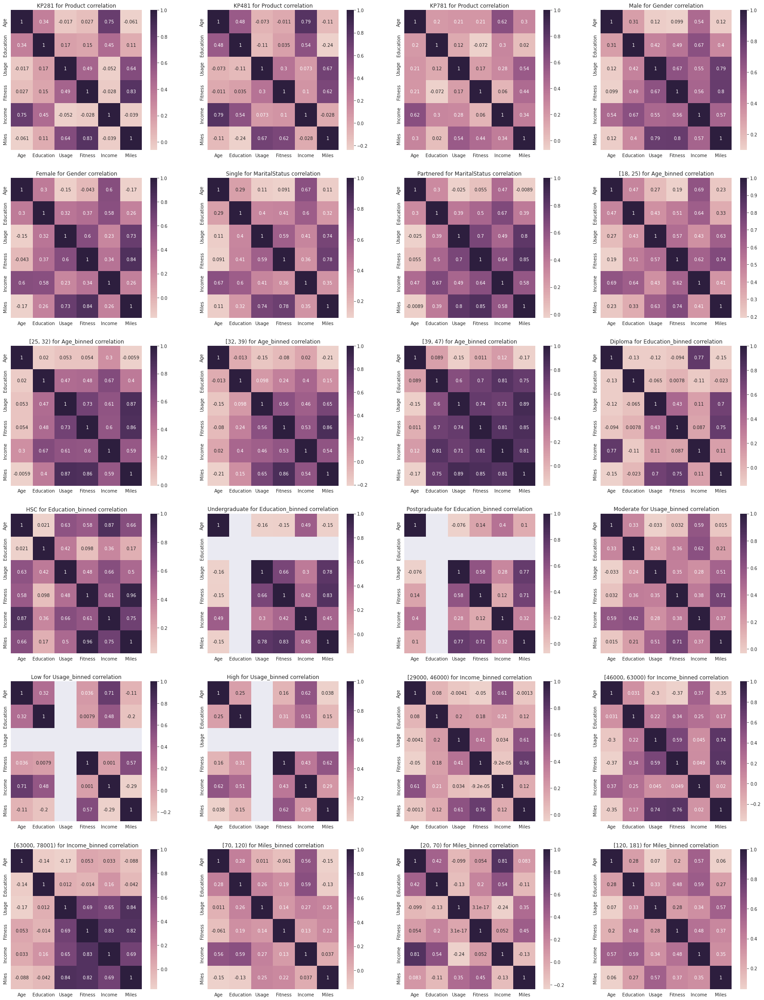

In [ ]:
# Observing the correlation between numerical variables for different categories
fig = plt.figure(figsize=(30, 40))

numerical_dtype = original['Age'].dtype
count = 0
for col in original.columns:
  if original[col].dtype != numerical_dtype:
    for category in original[col].unique():
      count += 1
      plt.subplot(6, 4, count)
      sns.heatmap(original.loc[original[col] == category, :].corr(), cmap=sns.cubehelix_palette(as_cmap=True), annot=True)
      plt.title(str(category) + " for " + col + " correlation")
plt.show()

<p>
  <u><em>General Analysis 7.5</u>: -</em> In general, <b> 0-0.19 is regarded as very weak or no correlation, 0.2-0.39 as weak, 0.40-0.59 as moderate, 0.6-0.79 as strong and 0.8-1 as very strong correlation </b>. From our previous analysis we see that "Income" is the most prominent factor in deciding what product the customer is likely to buy. We'll comment on the income relation with other features for specific catagories from the above visualizations-
  <ul>
    <li>There is a strong positive correlation between "Age" and "Income" for KP281 product.</li>
    <li>There is a strong positive correlation betweeen "Age" and "Income" for KP481 product.</li>
    <li>There is a strong positive correlation between "Age" and "Income" for KP781 product.</li>
    <li>There is a moderate positive correlation between "Education" and "Income" for KP281 product.</li>
    <li>There is a moderate positive correlation between "Education" and "Income" for KP481 product.</li>
    <li>There is a weak positive correlation between "Education" and "Income" for KP781 product.</li>
    <li>There is a moderate positive correlation between "Age" and "Income" for Males.</li>
    <li>There is a strong positive correlation between "Age" and "Income" for Females.</li>
    <li>There is a strong positive correlation between "Education" and "Income" for Males.</li>
    <li>There is a moderate positive correlation between "Education" and "Income" for Females.</li>
    <li>There is a moderate positive correlation between "Fitness", "Usage", "Miles" and "Income" for Males.</li>
    <li>There is a week positive correlation between "Fitness", "Usage", "Miles" and "Income" for Females.</li>
    <li>There is a strong positive correlation between "Age" and "Income" for customers with "Single" MaritalStatus.</li>
    <li>There is a moderate positive correlation between "Age" and "Income" for customers with "Partnered" MaritalStatus.</li>
    <li>There is a strong positive correlation between "Fitness" and "Income" for customers  with "Partnered" MaritalStatus.</li>
    <li>There is a moderate positive correlation between "Education" and "Income" for customers with "Partnered" MaritalStatus.</li>
    <li>There is a strong positive correlation between "Education", "Fitness" and "Income" for customers in age group between 18 to 24.</li>
    <li>There is a strong positive correlation between "Education", "Usage", "Fitness", "Miles" and "Income" for customers in age group between 25 to 31.</li>
    <li>There is a very strong positive correlation between "Education", "Usage", "Fitness", "Miles" and "Income" for customers in age group between 39 to 46.</li>
    <li>There is a strong positive correlation between "Age" and "Income" for customers with "Diploma" education.</li>
    <li>There is a very strong positive correlation between "Age" and "Income" for customers with "HSC" education level.</li>
    <li>There is a strong positive correlation between "Usage", "Fitness", "Miles" and "Income" for customers with "HSC" education level.</li>
    <li>There is a moderate-strong positive correlation between "Age", "Education" and "Income" for customers with "Moderate" usage level.</li>
    <li>There is a strong positive correlation between "Age" and "Income" for customers with "Low" usage level.</li>
    <li>There is a strong positive correlation between "Age" and "Income" for customers who walk/run 20 to 69 miles.</li>
  </ul>
</p>

# 8. Graphical Analysis 2: With Conditional and Marginal Probabilities

<p>
  <u><em>Quick Note</u>: -</em> I'll be assuming the dataset provided to be for the population.
</p>

In [ ]:
# First calculating probabilities for all categories for
# individual categorical features

# Probability for different Products
kp281_prob = round(len(original[original['Product'] == 'KP281'])/len(original), 2)
kp481_prob = round(len(original[original['Product'] == 'KP481'])/len(original), 2)
kp781_prob = round(len(original[original['Product'] == 'KP781'])/len(original), 2)

print(kp281_prob, kp481_prob, kp781_prob)

0.44 0.33 0.22


In [ ]:
# Probability for different Gender
male_prob = round(len(original[original['Gender'] == 'Male'])/len(original), 2)
female_prob = round(len(original[original['Gender'] == 'Female'])/len(original), 2)

print(male_prob, female_prob)

0.58 0.42


In [ ]:
# Probability for different MaritalStatus
single_prob = round(len(original[original['MaritalStatus'] == 'Single'])/len(original), 2)
partnered_prob = round(len(original[original['MaritalStatus'] == 'Partnered'])/len(original), 2)

print(single_prob, partnered_prob)

0.41 0.59


In [ ]:
# Probability for different Age Bins
unique_age_binned = original['Age_binned'].unique()
age_18_25_prob = round(len(original[original['Age_binned'] == unique_age_binned[0]])/len(original), 2)
age_25_32_prob = round(len(original[original['Age_binned'] == unique_age_binned[1]])/len(original), 2)
age_32_39_prob = round(len(original[original['Age_binned'] == unique_age_binned[2]])/len(original), 2)
age_39_47_prob = round(len(original[original['Age_binned'] == unique_age_binned[3]])/len(original), 2)

print(age_18_25_prob, age_25_32_prob, age_32_39_prob, age_39_47_prob)

0.3 0.4 0.2 0.1


In [ ]:
# Probability for different Education bins

hsc_prob = round(len(original[original['Education_binned'] == 'HSC'])/len(original), 2)
diploma_prob = round(len(original[original['Education_binned'] == 'Diploma'])/len(original), 2)
undergraduate_prob = round(len(original[original['Education_binned'] == 'Undergraduate'])/len(original), 2)
postgraduate_prob = round(len(original[original['Education_binned'] == 'Postgraduate'])/len(original), 2)

print(hsc_prob, diploma_prob, undergraduate_prob, postgraduate_prob)

0.04 0.33 0.47 0.15


In [ ]:
# Probability for different Usage bins

low_usage_prob = round(len(original[original['Usage_binned'] == 'Low'])/len(original), 2)
moderate_usage_prob = round(len(original[original['Usage_binned'] == 'Moderate'])/len(original), 2)
high_usage_prob = round(len(original[original['Usage_binned'] == 'High'])/len(original), 2)

print(low_usage_prob, moderate_usage_prob, high_usage_prob)

0.18 0.67 0.14


In [ ]:
# Probability for different Income Bins
unique_income_binned = original['Income_binned'].unique()
low_income_prob = round(len(original[original['Income_binned'] == unique_income_binned[0]])/len(original), 2)
moderate_income_prob = round(len(original[original['Income_binned'] == unique_income_binned[1]])/len(original), 2)
high_income_prob = round(len(original[original['Income_binned'] == unique_income_binned[2]])/len(original), 2)

print(low_income_prob, moderate_income_prob, high_income_prob)

0.35 0.47 0.18


In [ ]:
# Probability for different Miles Bins
unique_miles_binned = original['Miles_binned'].unique()
low_miles_prob = round(len(original[original['Miles_binned'] == unique_miles_binned[0]])/len(original), 2)
moderate_miles_prob = round(len(original[original['Miles_binned'] == unique_miles_binned[1]])/len(original), 2)
high_miles_prob = round(len(original[original['Miles_binned'] == unique_miles_binned[2]])/len(original), 2)

print(low_miles_prob, moderate_miles_prob, high_miles_prob)

0.49 0.26 0.25


<p>
  <u><em>Quick Note</u>: -</em> Calculating marginal probability for various products.
</p>

In [ ]:
# Calculating marginal probability, column-wise for
# "Product" with "Gender", "Income_binned", "MaritalStatus"

cross1 = pd.crosstab(original['Product'], [original['Gender'], original['Income_binned'], original['MaritalStatus']],
                     margins=True, margins_name='Total', normalize='columns')
cross1

Gender                Female                                     \
Income_binned [29000, 46000)           [46000, 63000)             
MaritalStatus      Partnered    Single      Partnered    Single   
Product                                                           
KP281               0.722222  0.538462       0.565217  0.357143   
KP481               0.277778  0.461538       0.391304  0.500000   
KP781               0.000000  0.000000       0.043478  0.142857   

Gender                                           Male            \
Income_binned [63000, 78001)           [29000, 46000)             
MaritalStatus      Partnered    Single      Partnered    Single   
Product                                                           
KP281                    0.2  0.333333       0.466667  0.705882   
KP481                    0.2  0.333333       0.533333  0.294118   
KP781                    0.6  0.333333       0.000000  0.000000   

Gender                                                              Total  
Income_binned [46000, 63000)           [63000, 78001)                      
MaritalStatus      Partnered    Single      Partnered    Single            
Product                                                                    
KP281               0.464286  0.368421       0.055556  0.000000  0.444444  
KP481               0.428571  0.210526       0.055556  0.142857  0.333333  
KP781               0.107143  0.421053       0.888889  0.857143  0.222222

<p>
  <u><em>General Analysis 8.1</u>: -</em> From the above analysis we can fill out some of the customer profiling. We'll only consider <b>probabilities > 0.70 </b>or sometimes <b>probabilities > 0.60 </b> to be a strong match.
</p>

<p>
  <u><em>Quick Note</u>: -</em> Lets calculate and analyse conditional probabilities for Product based on the features we found interesting based on our prior analysis in correlation section.
</p>

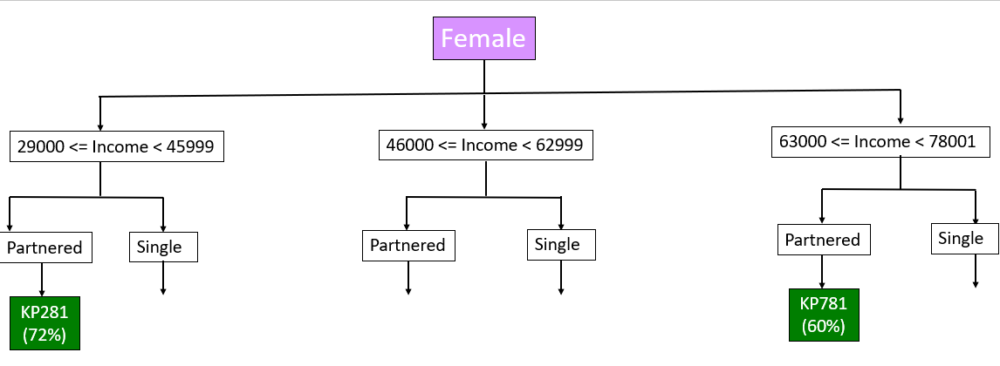

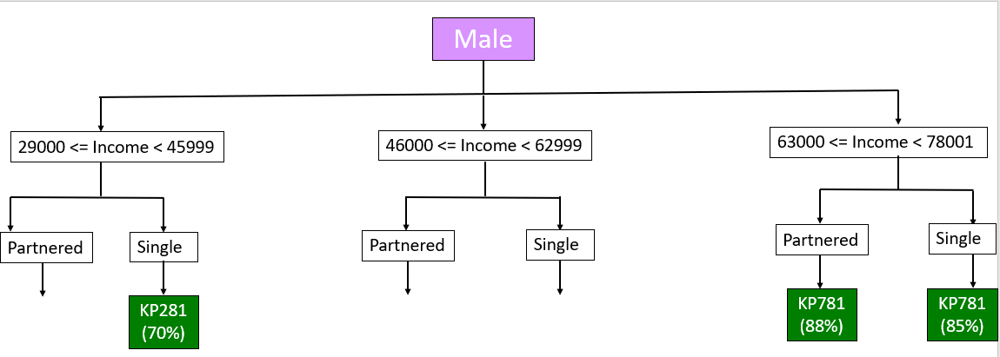

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Female, 29000<=Income<45999, MaritalStatus=Single
female_low_income_single = original[(original['Gender'] == 'Female') & (original['Income_binned'] == original['Income_binned'].unique()[0]) & (original['MaritalStatus'] == 'Single')]
pd.crosstab(female_low_income_single['Product'], [female_low_income_single['Gender'], female_low_income_single['Income_binned'], female_low_income_single['Education_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                   Female                   Total
Income_binned    [29000, 46000)                        
Education_binned        Diploma Undergraduate          
Product                                                
KP281                     0.375           0.8  0.538462
KP481                     0.625           0.2  0.461538

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Fitness"

# For Gender=Female, 29000<=Income<45999, MaritalStatus=Single, Education='Diploma'
female_low_income_single_diploma = female_low_income_single[female_low_income_single['Education_binned'] == 'Diploma']
pd.crosstab(female_low_income_single_diploma['Product'],
            [female_low_income_single_diploma['Gender'], female_low_income_single_diploma['Income_binned'],
             female_low_income_single_diploma['Education_binned'], female_low_income_single_diploma['Fitness']],
            margins=True, margins_name='Total', normalize='columns')

Gender                   Female                 Total
Income_binned    [29000, 46000)                      
Education_binned        Diploma                      
Fitness                       2         3    4       
Product                                              
KP281                      0.25  0.666667  0.0  0.375
KP481                      0.75  0.333333  1.0  0.625

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Miles_binned"

# For Gender=Female, 29000<=Income<45999, MaritalStatus=Single
female_low_income_single = original[(original['Gender'] == 'Female') & (original['Income_binned'] == original['Income_binned'].unique()[0]) & (original['MaritalStatus'] == 'Single')]
pd.crosstab(female_low_income_single['Product'], [female_low_income_single['Gender'], female_low_income_single['Income_binned'], female_low_income_single['Miles_binned']],
            margins=True, margins_name='Total', normalize='columns')

/usr/local/lib/python3.9/dist-packages/pandas/core/reshape/pivot.py:188: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  agged[v] = maybe_downcast_to_dtype(agged[v], data[v].dtype)


Gender                Female                          Total
Income_binned [29000, 46000)                               
Miles_binned        [20, 70) [70, 120) [120, 181)          
Product                                                    
KP281                    0.4  0.714286        0.0  0.538462
KP481                    0.6  0.285714        1.0  0.461538

<p>
  <u><em>General Analysis 8.2</u>: -</em> After all this calculations we can see fill up the low income female category.
</p>

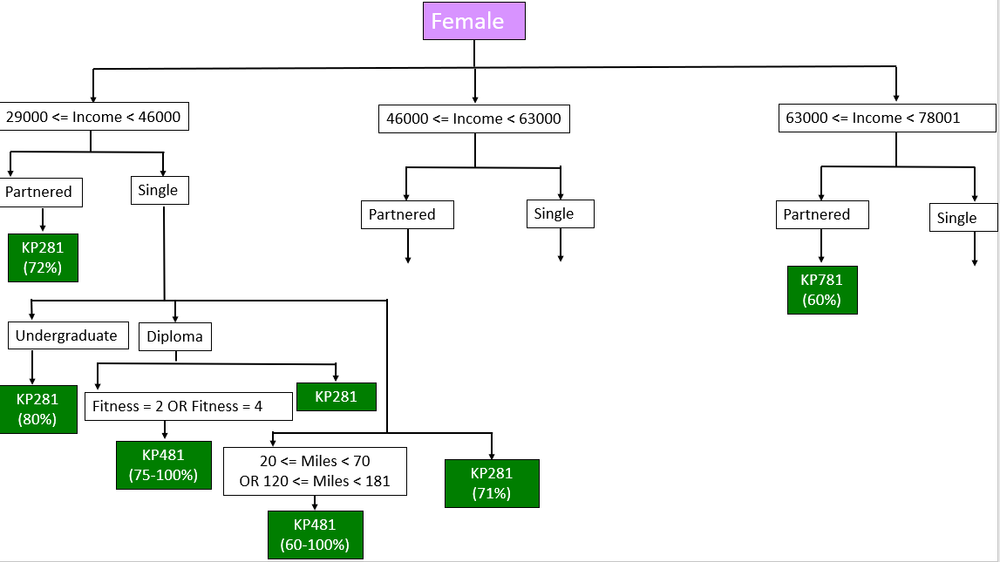

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Female, 63000<=Income<78001, MaritalStatus=Single
female_high_income_single = original[(original['Gender'] == 'Female') & (original['Income_binned'] == original['Income_binned'].unique()[2]) & (original['MaritalStatus'] == 'Single')]
pd.crosstab(female_high_income_single['Product'], [female_high_income_single['Gender'], female_high_income_single['Income_binned'], female_high_income_single['Education_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender,Female,Total
Income_binned,"[63000, 78001)",
Education_binned,Postgraduate,
Product,,
KP281,0.333333,0.333333
KP481,0.333333,0.333333
KP781,0.333333,0.333333


In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Fitness"

# For Gender=Female, 63000<=Income<78001, MaritalStatus=Single
female_high_income_single = original[(original['Gender'] == 'Female') & (original['Income_binned'] == original['Income_binned'].unique()[2]) & (original['MaritalStatus'] == 'Single')]
pd.crosstab(female_high_income_single['Product'], [female_high_income_single['Gender'], female_high_income_single['Income_binned'], female_high_income_single['Fitness']],
            margins=True, margins_name='Total', normalize='columns')

Gender,Female,Total
Income_binned,"[63000, 78001)",
Fitness,3,
Product,,
KP281,0.333333,0.333333
KP481,0.333333,0.333333
KP781,0.333333,0.333333


In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Usage_binned"

# For Gender=Female, 63000<=Income<78001, MaritalStatus=Single
female_high_income_single = original[(original['Gender'] == 'Female') & (original['Income_binned'] == original['Income_binned'].unique()[2]) & (original['MaritalStatus'] == 'Single')]
pd.crosstab(female_high_income_single['Product'], [female_high_income_single['Gender'], female_high_income_single['Income_binned'], female_high_income_single['Usage_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                Female              Total
Income_binned [63000, 78001)                   
Usage_binned             Low Moderate          
Product                                        
KP281                    0.0      0.5  0.333333
KP481                    1.0      0.0  0.333333
KP781                    0.0      0.5  0.333333

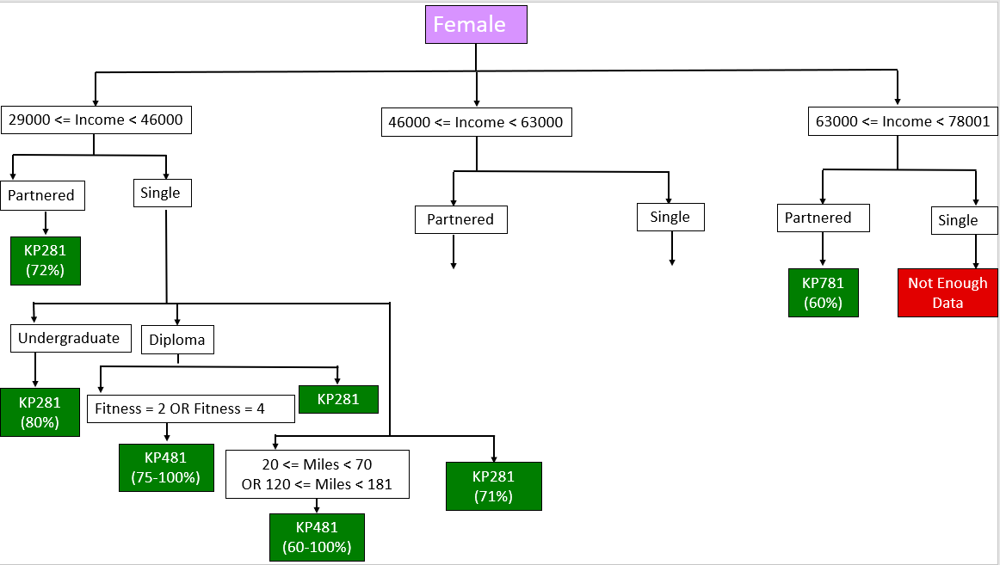

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Age_binned"

# For Gender=Female, 46000<=Income<63000, MaritalStatus=Single
female_moderate_income_single = original[(original['Gender'] == 'Female') & (original['Income_binned'] == original['Income_binned'].unique()[1]) & (original['MaritalStatus'] == 'Single')]
pd.crosstab(female_moderate_income_single['Product'], [female_moderate_income_single['Gender'], female_moderate_income_single['Income_binned'], female_moderate_income_single['Age_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                Female                                Total
Income_binned [46000, 63000)                                     
Age_binned          [18, 25) [25, 32) [32, 39) [39, 47)          
Product                                                          
KP281                   0.25      0.0      0.6      0.5  0.357143
KP481                   0.25      1.0      0.4      0.5  0.500000
KP781                   0.50      0.0      0.0      0.0  0.142857

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Female, 46000<=Income<63000, MaritalStatus=Single
female_moderate_income_single_age_18_25 = original[(original['Gender'] == 'Female')
                                                  & (original['Income_binned'] == original['Income_binned'].unique()[1])
                                                  & (original['MaritalStatus'] == 'Single')
                                                  & (original['Age_binned'] == original['Age_binned'].unique()[0])]
pd.crosstab(female_moderate_income_single_age_18_25['Product'],
            [female_moderate_income_single_age_18_25['Gender'], female_moderate_income_single_age_18_25['Income_binned'],
             female_moderate_income_single_age_18_25['Education_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                   Female               Total
Income_binned    [46000, 63000)                    
Education_binned   Postgraduate Undergraduate      
Product                                            
KP281                       0.0      0.333333  0.25
KP481                       0.0      0.333333  0.25
KP781                       1.0      0.333333  0.50

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Female, 46000<=Income<63000, MaritalStatus=Single
female_moderate_income_single_age_18_25 = original[(original['Gender'] == 'Female')
                                                  & (original['Income_binned'] == original['Income_binned'].unique()[1])
                                                  & (original['MaritalStatus'] == 'Single')
                                                  & ~(original['Age_binned'] == original['Age_binned'].unique()[0])]
pd.crosstab(female_moderate_income_single_age_18_25['Product'],
            [female_moderate_income_single_age_18_25['Gender'], female_moderate_income_single_age_18_25['Income_binned'],
             female_moderate_income_single_age_18_25['Education_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                   Female                                 Total
Income_binned    [46000, 63000)                                      
Education_binned        Diploma  HSC Postgraduate Undergraduate      
Product                                                              
KP281                       0.5  0.0          0.0           0.5   0.4
KP481                       0.5  1.0          1.0           0.5   0.6

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Fitness"

# For Gender=Female, 46000<=Income<63000, MaritalStatus=Single
female_moderate_income_single_age_18_25 = original[(original['Gender'] == 'Female')
                                                  & (original['Income_binned'] == original['Income_binned'].unique()[1])
                                                  & (original['MaritalStatus'] == 'Single')
                                                  & ~(original['Age_binned'] == original['Age_binned'].unique()[0])]
pd.crosstab(female_moderate_income_single_age_18_25['Product'],
            [female_moderate_income_single_age_18_25['Gender'], female_moderate_income_single_age_18_25['Income_binned'],
             female_moderate_income_single_age_18_25['Fitness']],
            margins=True, margins_name='Total', normalize='columns')

Gender                Female           Total
Income_binned [46000, 63000)                
Fitness                    2    3    4      
Product                                     
KP281               0.666667  0.0  0.5   0.4
KP481               0.333333  1.0  0.5   0.6

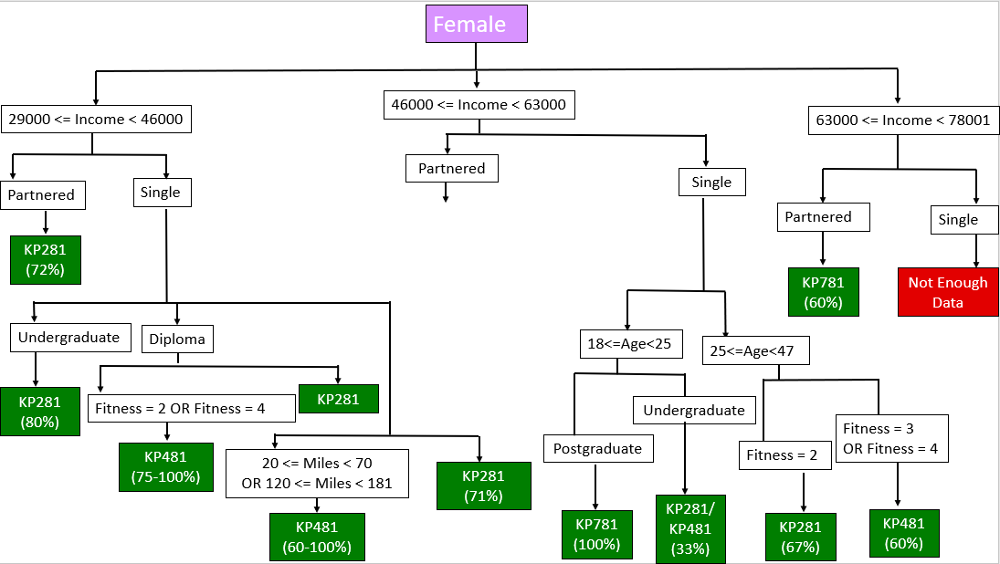

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Age_binned"

# For Gender=Female, 46000<=Income<63000, MaritalStatus=Partnered
female_moderate_income_partnered = original[(original['Gender'] == 'Female') & (original['Income_binned'] == original['Income_binned'].unique()[1]) & (original['MaritalStatus'] == 'Partnered')]
pd.crosstab(female_moderate_income_partnered['Product'], [female_moderate_income_partnered['Gender'], female_moderate_income_partnered['Income_binned'], female_moderate_income_partnered['Age_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                Female                       Total
Income_binned [46000, 63000)                            
Age_binned          [25, 32) [32, 39) [39, 47)          
Product                                                 
KP281               0.692308    0.375      0.5  0.565217
KP481               0.230769    0.625      0.5  0.391304
KP781               0.076923    0.000      0.0  0.043478

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Female, 46000<=Income<63000, MaritalStatus=Partnered
female_moderate_income_partnered_age_25_47 = female_moderate_income_partnered[~(female_moderate_income_partnered['Age_binned'] == original['Age_binned'].unique()[0])]
pd.crosstab(female_moderate_income_partnered_age_25_47['Product'],
            [female_moderate_income_partnered_age_25_47['Gender'], female_moderate_income_partnered_age_25_47['Income_binned'],
             female_moderate_income_partnered_age_25_47['Education_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                   Female                                Total
Income_binned    [46000, 63000)                                     
Education_binned        Diploma Postgraduate Undergraduate          
Product                                                             
KP281                  0.666667          0.0      0.538462  0.565217
KP481                  0.333333          0.0      0.461538  0.391304
KP781                  0.000000          1.0      0.000000  0.043478

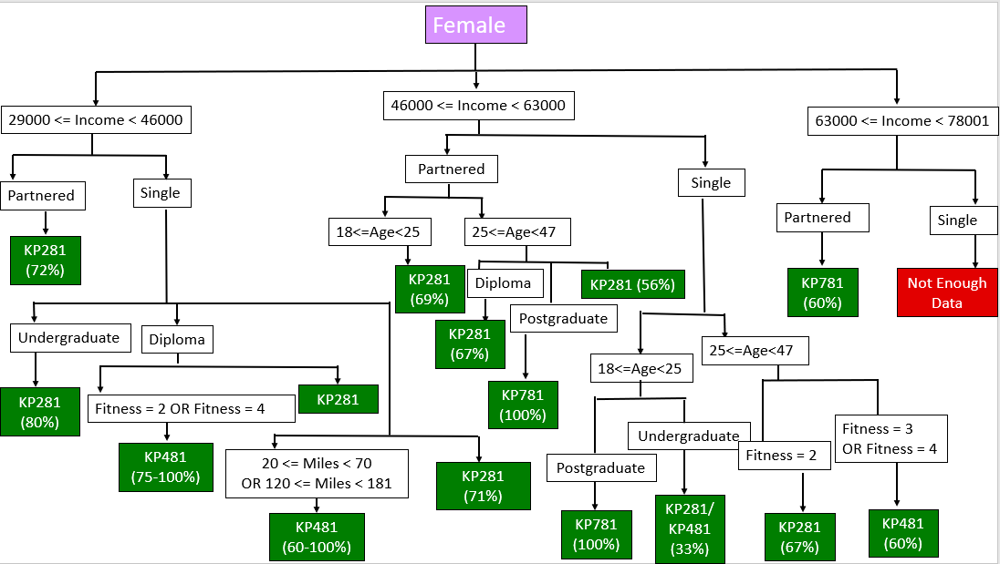

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Age_binned"

# For Gender=Male, 29000<=Income<45999, MaritalStatus=Partnered
male_low_income_partnered = original[(original['Gender'] == 'Male') & (original['Income_binned'] == original['Income_binned'].unique()[0]) & (original['MaritalStatus'] == 'Partnered')]
pd.crosstab(male_low_income_partnered['Product'],
            [male_low_income_partnered['Gender'], male_low_income_partnered['Income_binned'],
             male_low_income_partnered['Age_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                  Male              Total
Income_binned [29000, 46000)                   
Age_binned          [18, 25) [25, 32)          
Product                                        
KP281               0.454545      0.5  0.466667
KP481               0.545455      0.5  0.533333

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Male, 29000<=Income<45999, MaritalStatus=Partnered
male_low_income_partnered = original[(original['Gender'] == 'Male') & (original['Income_binned'] == original['Income_binned'].unique()[0]) & (original['MaritalStatus'] == 'Partnered')]
pd.crosstab(male_low_income_partnered['Product'],
            [male_low_income_partnered['Gender'], male_low_income_partnered['Income_binned'],
             male_low_income_partnered['Education_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                     Male                             Total
Income_binned    [29000, 46000)                                  
Education_binned        Diploma       HSC Undergraduate          
Product                                                          
KP281                       0.2  0.666667      0.571429  0.466667
KP481                       0.8  0.333333      0.428571  0.533333

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Usage_binned"

# For Gender=Male, 29000<=Income<45999, MaritalStatus=Partnered
male_low_income_partnered_under_post = male_low_income_partnered[male_low_income_partnered['Education_binned'].isin(['Undergraduate', 'Postgraduate'])]
pd.crosstab(male_low_income_partnered_under_post['Product'],
            [male_low_income_partnered_under_post['Gender'], male_low_income_partnered_under_post['Income_binned'],
             male_low_income_partnered_under_post['Usage_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                  Male               Total
Income_binned [29000, 46000)                    
Usage_binned             Low  Moderate          
Product                                         
KP281                    0.0  0.666667  0.571429
KP481                    1.0  0.333333  0.428571

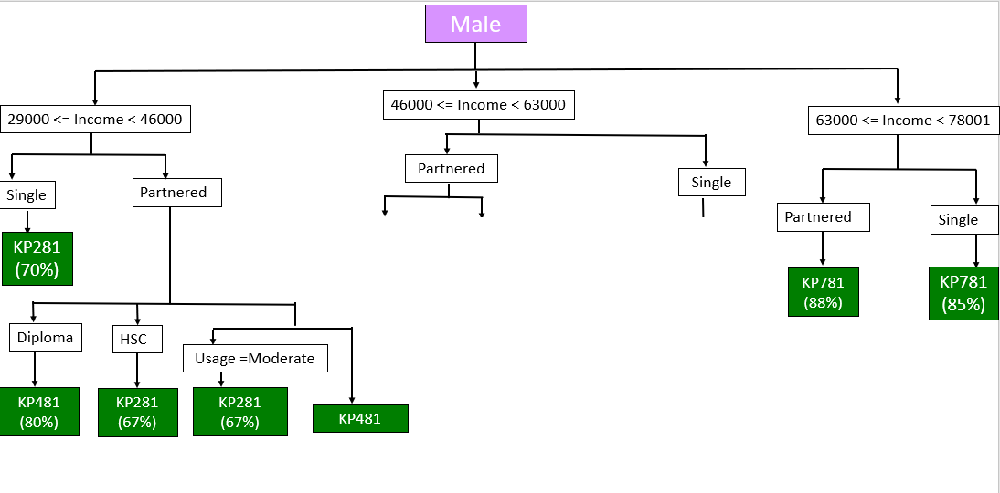

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Age_binned"

# For Gender=Male, 29000<=Income<45999, MaritalStatus=Partnered
male_moderate_income_partnered = original[(original['Gender'] == 'Male') & (original['Income_binned'] == original['Income_binned'].unique()[1]) & (original['MaritalStatus'] == 'Partnered')]
pd.crosstab(male_moderate_income_partnered['Product'],
            [male_moderate_income_partnered['Gender'], male_moderate_income_partnered['Income_binned'],
             male_moderate_income_partnered['Age_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                  Male                                   Total
Income_binned [46000, 63000)                                        
Age_binned          [18, 25)  [25, 32)  [32, 39)  [39, 47)          
Product                                                             
KP281                    0.0  0.444444  0.363636  0.714286  0.464286
KP481                    0.0  0.333333  0.636364  0.285714  0.428571
KP781                    1.0  0.222222  0.000000  0.000000  0.107143

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Male, 29000<=Income<45999, MaritalStatus=Partnered
male_moderate_income_partnered_age_18_39 = male_moderate_income_partnered[~(original['Age_binned'] == original['Age_binned'].unique()[-1])]
pd.crosstab(male_moderate_income_partnered_age_18_39['Product'],
            [male_moderate_income_partnered_age_18_39['Gender'], male_moderate_income_partnered_age_18_39['Income_binned'],
             male_moderate_income_partnered_age_18_39['Education_binned']],
            margins=True, margins_name='Total', normalize='columns')

<ipython-input-205-d6a69b2e95ee>:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  male_moderate_income_partnered_age_18_39 = male_moderate_income_partnered[~(original['Age_binned'] == original['Age_binned'].unique()[-1])]


Gender                     Male                                     Total
Income_binned    [46000, 63000)                                          
Education_binned        Diploma  HSC Postgraduate Undergraduate          
Product                                                                  
KP281                       1.0  0.0          0.0        0.3125  0.380952
KP481                       0.0  1.0          0.0        0.5625  0.476190
KP781                       0.0  0.0          1.0        0.1250  0.142857

In [ ]:
# The above probabilities look like they might be because of less number of records
# BUT THIS IS NOT SO
male_moderate_income_partnered_age_18_39

,Product,Age,Gender,Education,MaritalStatus,Usage,Fitness,Income,Miles,Age_binned,Education_binned,Usage_binned,Income_binned,Miles_binned
36,KP281,26,Male,16,Partnered,2,2,53439,47,"[25, 32)",Undergraduate,Low,"[46000, 63000)","[20, 70)"
37,KP281,26,Male,16,Partnered,3,3,51165,85,"[25, 32)",Undergraduate,Moderate,"[46000, 63000)","[70, 120)"
53,KP281,30,Male,14,Partnered,4,4,46617,141,"[25, 32)",Diploma,Moderate,"[46000, 63000)","[120, 181)"
55,KP281,31,Male,14,Partnered,2,2,54576,47,"[25, 32)",Diploma,Low,"[46000, 63000)","[20, 70)"
58,KP281,32,Male,14,Partnered,4,3,52302,85,"[32, 39)",Diploma,Moderate,"[46000, 63000)","[70, 120)"
63,KP281,35,Male,16,Partnered,4,3,48891,85,"[32, 39)",Undergraduate,Moderate,"[46000, 63000)","[70, 120)"
68,KP281,38,Male,16,Partnered,3,3,46617,75,"[32, 39)",Undergraduate,Moderate,"[46000, 63000)","[70, 120)"
71,KP281,38,Male,16,Partnered,3,3,56850,75,"[32, 39)",Undergraduate,Moderate,"[46000, 63000)","[70, 120)"
99,KP481,25,Male,16,Partnered,2,2,52302,42,"[25, 32)",Undergraduate,Low,"[46000, 63000)","[20, 70)"
105,KP481,25,Male,16,Partnered,2,3,50028,53,"[25, 32)",Undergraduate,Low,"[46000, 63000)","[20, 70)"


<p>
  <u><em>Quick Note</u>: -</em> Probabilities for Diploma and Undergraduate is not because of just 1 record. So, we'll consider those.
</p>

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Education_binned"

# For Gender=Male, 29000<=Income<45999, MaritalStatus=Partnered
male_moderate_income_partnered_age_18_39_under_post = male_moderate_income_partnered_age_18_39[(original['Education_binned'].isin(['Undergraduate', 'Postgraduate']))]
pd.crosstab(male_moderate_income_partnered_age_18_39_under_post['Product'],
            [male_moderate_income_partnered_age_18_39_under_post['Gender'], male_moderate_income_partnered_age_18_39_under_post['Income_binned'],
             male_moderate_income_partnered_age_18_39_under_post['Miles_binned']],
            margins=True, margins_name='Total', normalize='columns')

<ipython-input-207-f98035892f7e>:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  male_moderate_income_partnered_age_18_39_under_post = male_moderate_income_partnered_age_18_39[(original['Education_binned'].isin(['Undergraduate', 'Postgraduate']))]


Gender                  Male                          Total
Income_binned [46000, 63000)                               
Miles_binned        [20, 70) [70, 120) [120, 181)          
Product                                                    
KP281                   0.25  0.363636        0.0  0.294118
KP481                   0.75  0.545455        0.0  0.529412
KP781                   0.00  0.090909        1.0  0.176471

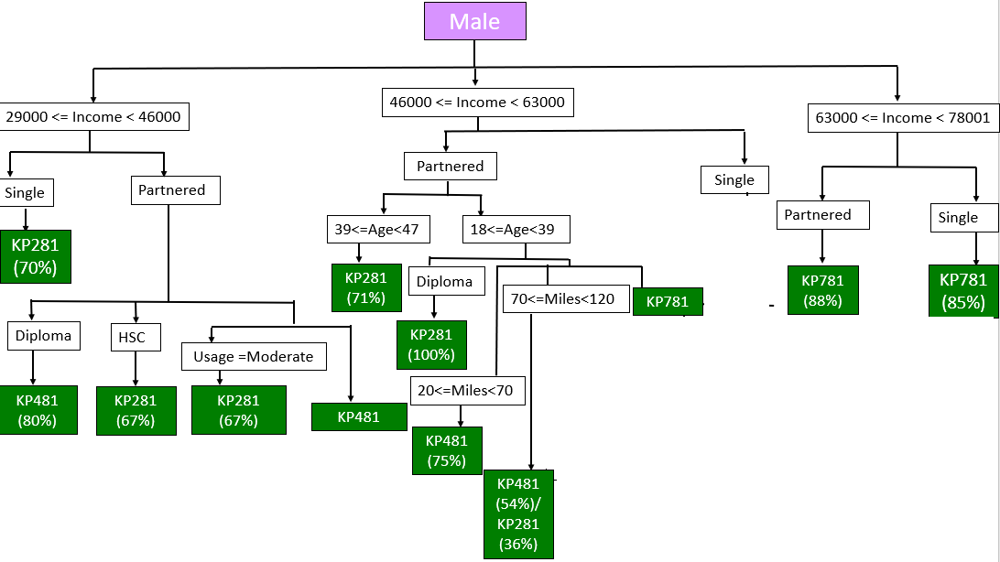

In [ ]:
# Calculating marginal probability, column-wise for 
# "Product" with "Gender", "Income_binned", "Age_binned"

# For Gender=Male, 29000<=Income<45999, MaritalStatus=Single
male_moderate_income_single = original[(original['Gender'] == 'Male') & (original['Income_binned'] == original['Income_binned'].unique()[1]) & (original['MaritalStatus'] == 'Single')]
pd.crosstab(male_moderate_income_single['Product'],
            [male_moderate_income_single['Gender'], male_moderate_income_single['Income_binned'],
             male_moderate_income_single['Age_binned']],
            margins=True, margins_name='Total', normalize='columns')

Gender                  Male                        Total
Income_binned [46000, 63000)                             
Age_binned          [18, 25) [25, 32)  [32, 39)          
Product                                                  
KP281                  0.000    0.625  0.666667  0.368421
KP481                  0.125    0.250  0.333333  0.210526
KP781                  0.875    0.125  0.000000  0.421053

<p>
  <u><em>General Analysis 8.6</u>: -</em> Final customer profiles are as below -
</p>

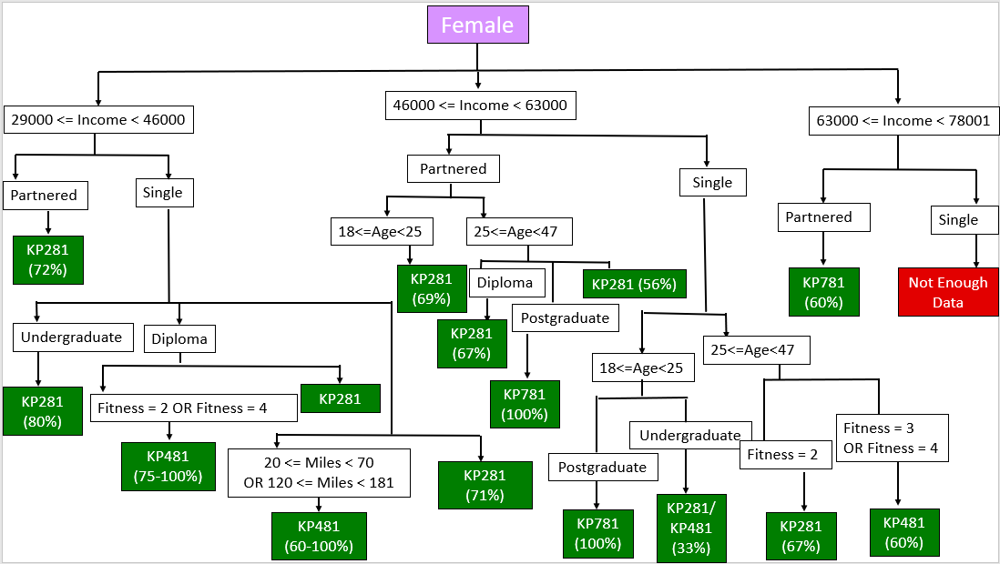

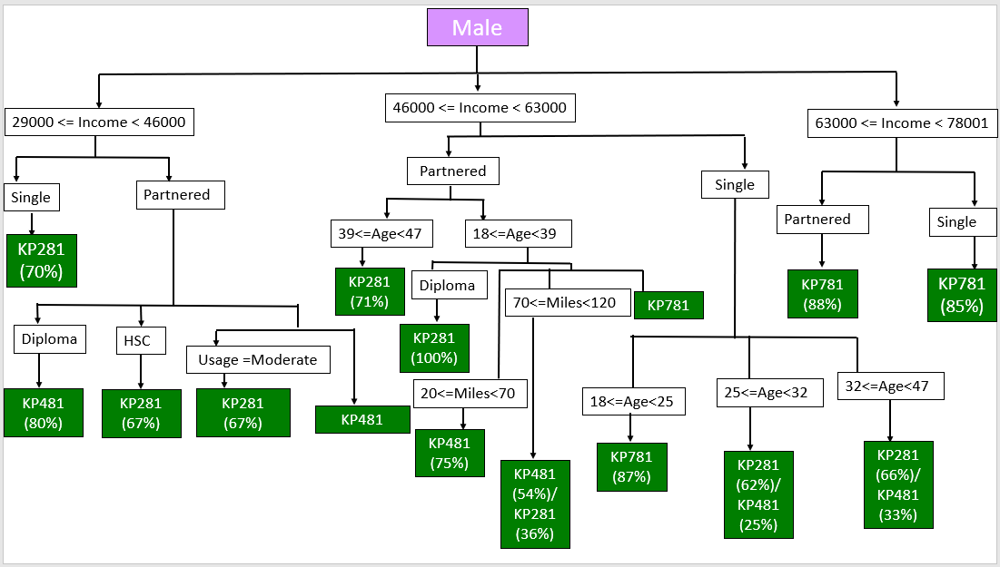

# 9. Conclusion: Recommendations based on Customer Profiles

<h2>Business Recommendations</h2>
<p>From our insights in above analysis we can deduce below recommendations to 
the business: -
<ol>
  <li>The most frequently occuring Age in our dataset is 25 (since, mode(Age) = 25). From here we can infer that youth around the age of 25 is more concerned about fitness and is most aware about various fitness equipments, hence Vibha-GMC.</li>
  <li>The most frequently occuring years of Education in our dataset are 16 years, 14 years and 18 years in that order. This means that people with Batchlors degree are most concerned about their fitness and are more likely to enquire and buy Vibha-GMC trademills. Then comes people with Diploma and then comes people with either Masters or Doctorate. We must concentrate on these groups of people.</li>
  <li>We have 3 most frequently occuring Fitness levels, namely 3 days/week, 5 days/week and 2 days/week. The peak for 3 days/week is the highest, that means people with moderate workout routine are more likely to buy Vibha-GMC's product.</li>
  <li>We observe a peak abound $50000 income. The people around this income range are more likely to buy products of Vibha-GMC.</li>
  <li>If "Income" and "Age" are so high to be qualified as outliers the customer would most likely buy "KP781".</li>
  <li>If "Income", "Usage", and "Miles" are so high to be qualified as outliers the customer would most likely buy "KP781".</li>
  <li>If "Income", "Education", "Usage" and "Miles" are so high to be qualified as outliers the customer would most likely buy "KP781".</li>
  <li>We see the minimum and median incomes are more for costlier products, i.e. Income for people who buy KP781 > Income for people who buy KP481 > Income for people who buy KP281.</li>
    <li>The median income is very high for customers who bought KP781 model, this means that we can expect customers with > $75000 to buy KP781 product.</li>
  <li><b>All the business insights can be consolidated by the user profiling diagram: -</b></li>
</ol>
</p>

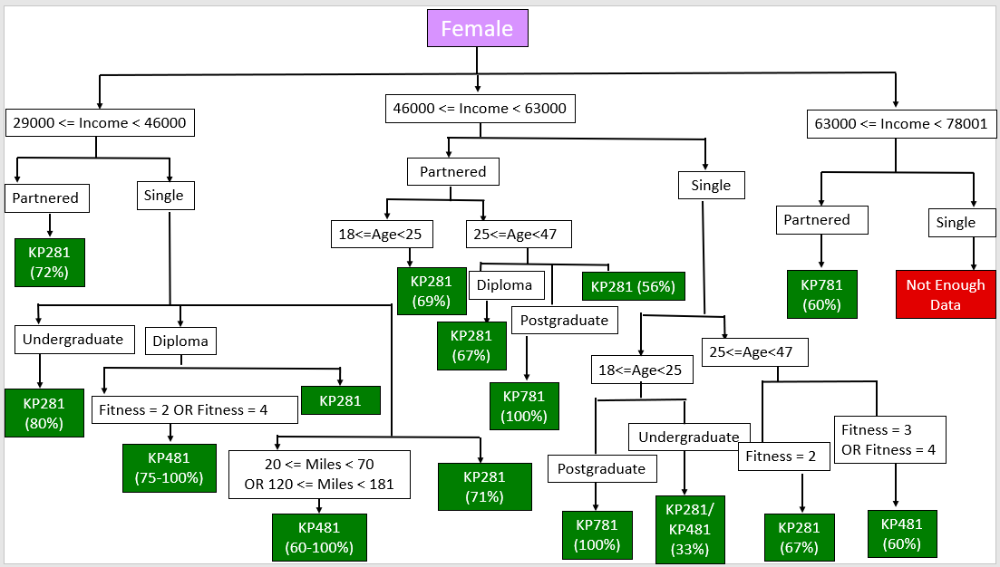

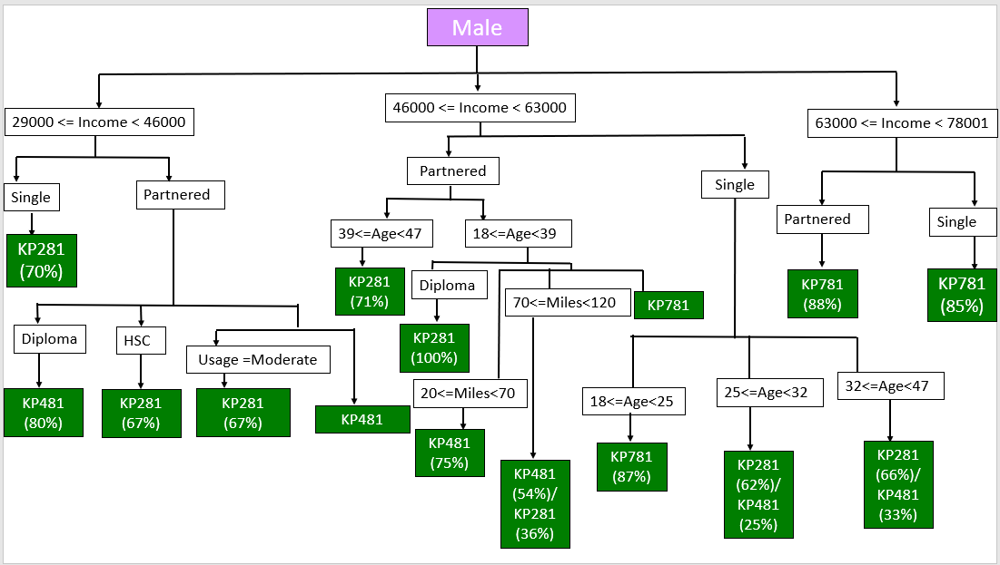